In [30]:
import gc
del stim_nwb
del stim_io
del lfp_nwb
del lfp_io
gc.collect()

497

11612

In [3]:
try:
    %cd openscope_databook
    from databook_utils.dandi_utils import dandi_download_open
    %cd ..
except:
    !git clone https://github.com/AllenInstitute/openscope_databook.git
    %cd openscope_databook
    %pip install -e .
    
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np
import pandas as pd
from dandi import dandiapi
from pynwb import NWBHDF5IO
from math import sqrt
from scipy import interpolate
import scipy.signal
from scipy.ndimage import gaussian_filter
import icsd
from scipy.signal import welch
import math
import quantities as pq
#from tqdm import tqdm
#import xarray as xr
#import os

# Import the FOOOF object
from fooof import FOOOF
from fooof.sim.gen import gen_power_spectrum
from fooof.sim.utils import set_random_seed
from fooof.plts.spectra import plot_spectra
from fooof.plts.annotate import plot_annotated_model

%matplotlib inline
sub_sessions = [("sub-619296", "ses-1187930705"), ("sub-620333", "ses-1188137866"), ("sub-620334", "ses-1189887297"), ("sub-625545", "ses-1182865981"), ("sub-625554", "ses-1181330601"), ("sub-625555", "ses-1183070926"), ("sub-630506", "ses-1192952695"), ("sub-631510", "ses-1196157974"), ("sub-631570", "ses-1194857009"), ("sub-633229", "ses-1199247593"), ("sub-637484", "ses-1208667752")]
#read nwb file
filename = "sub-619296_ses-1187930705-acq-FINAL_ogen.nwb"
filepath = "../material/00248_v240130/sub-619296/sub-619296_ses-1187930705_ogen.nwb"
stim_io = NWBHDF5IO(filepath, mode="r", load_namespaces=True)
stim_nwb = stim_io.read()


C:\Users\USER\Desktop\minseok_kim\code\openscope_databook
C:\Users\USER\Desktop\minseok_kim\code


In [4]:
probe_num = 2

stim_num = [110000, 110101, 110105, 110106, 110107, 110109, 110110, 110111, 110506, 110511, 111105, 111109, 111201, 111299, 111301, 111302, 111303, 111304, 111305, 111306, 111307, 111308]

lfp_filename = "sub-619296_ses-1187930705-acq-FINAL_probe-" + str(probe_num) + "_ecephys.nwb"
lfp_filepath = "../material/00248_v240130/sub-619296/sub-619296_ses-1187930705_probe-" + str(probe_num) + "_ecephys.nwb"
lfp_io = NWBHDF5IO(lfp_filepath, mode="r", load_namespaces=True)
lfp_nwb = lfp_io.read()
lfp = lfp_nwb.acquisition["probe_" + str(probe_num) + "_lfp_data"]

In [5]:
for i in range(len(lfp.electrodes)) :
    print(i, lfp.electrodes['location'][i], round(lfp.electrodes['probe_vertical_position'][i]/1000, 3), round(lfp.electrodes['y'][i]/1000, 3))
def get_loc_boundary(lfp) :
    boundary = []
    location = lfp.electrodes['location'][0]
    yposition = round(lfp.electrodes['probe_vertical_position'][0], 3)
    for i in range(len(lfp.electrodes)) :
        if location == lfp.electrodes['location'][i] : continue
        location = lfp.electrodes['location'][i]
        yposition = round((lfp.electrodes['probe_vertical_position'][i-1] + lfp.electrodes['probe_vertical_position'][i])/2, 3)
        boundary.append(yposition)

    return boundary

boundary = get_loc_boundary(lfp)

0 SCig 0.04 3.111
1 SCig 0.08 3.076
2 SCig 0.12 3.04
3 SCig 0.16 2.996
4 SCig 0.2 2.961
5 SCig 0.24 2.925
6 SCig 0.28 2.89
7 SCig 0.32 2.854
8 SCig 0.36 2.819
9 SCig 0.4 2.775
10 SCig 0.44 2.739
11 SCig 0.48 2.704
12 SCig 0.52 2.668
13 SCig 0.56 2.633
14 SCig 0.6 2.597
15 SCig 0.64 2.553
16 SCig 0.68 2.518
17 SCig 0.72 2.483
18 SCig 0.76 2.447
19 POST 0.8 2.421
20 POST 0.84 2.385
21 POST 0.88 2.359
22 POST 0.92 2.323
23 POST 0.96 2.297
24 POST 1.0 2.27
25 POST 1.04 2.234
26 POST 1.08 2.208
27 POST 1.12 2.172
28 POST 1.16 2.145
29 POST 1.2 2.118
30 POST 1.24 2.081
31 POST 1.28 2.054
32 POST 1.32 2.017
33 HPF 1.36 1.989
34 HPF 1.4 1.962
35 HPF 1.44 1.924
36 HPF 1.48 1.896
37 HPF 1.52 1.858
38 HPF 1.56 1.83
39 HPF 1.6 1.801
40 HPF 1.64 1.763
41 HPF 1.68 1.734
42 HPF 1.72 1.695
43 HPF 1.76 1.666
44 HPF 1.8 1.637
45 HPF 1.84 1.598
46 HPF 1.88 1.568
47 VISp6b 1.92 1.529
48 VISp6a 1.96 1.5
49 VISp6a 2.0 1.46
50 VISp6a 2.04 1.431
51 VISp6a 2.08 1.401
52 VISp6a 2.12 1.362
53 VISp5 2.16 1.333
54

In [6]:
print(boundary)

[780.0, 1340.0, 1900.0, 1940.0, 2140.0, 2420.0, 2580.0, 2900.0, 3020.0]


In [7]:
def get_all_stim_times(stim_nwb, frame_num):
    stim_table = stim_nwb.intervals["ICwcfg1_presentations"] #chosen stimulus

    frame = stim_table.frame[:]
    nzframe_idxs = np.nonzero(frame)[0]
    start_idx = int(nzframe_idxs[0])
    end_idx = int(nzframe_idxs[-1])

    start_time = stim_table.start_time[start_idx]
    end_time = stim_table.stop_time[end_idx]

    stim_select = lambda row : int(row['frame'].iloc[0]) == frame_num
    all_stim_times = [float(row['start_time'].iloc[0]) for i, row in enumerate(stim_table) if i % 2 == 0 and stim_select(row) and i >= start_idx and i <= end_idx]
    print(len(all_stim_times))
    return all_stim_times

all_stim_times = []
for frame_num in range(len(stim_num)) :
    all_stim_times.append(get_all_stim_times(stim_nwb, frame_num))
#print("There are", len(all_stim_times), "stimulus times from rows that satisfy the condition.")

400
400
400
400
400
400
400
400
50
50
400
400
400
400
50
50
50
50
50
50
50
50


In [8]:
def get_timestamps_data(lfp, all_stim_times):
    #print("First timestamp stimulus data: ", all_stim_times[0])
    #print("Last timestamp stimulus data: ", all_stim_times[-1])
    #print("First timestamp LFP data: ", lfp.timestamps[0])
    #print("Last timestamp LFP data: ", lfp.timestamps[-1])
    period_start = lfp.timestamps[0]
    period_end = lfp.timestamps[-1]
    # filter stim_timestamps to just timestamps within period
    stim_times = np.array([ts for ts in all_stim_times if ts >= period_start and ts <= period_end])
    if len(stim_times) == 0:
        raise ValueError("There are no stimulus timestamps in that period")

    # find indices within lfp data that correspond to period bounds
    period_start_idx, period_end_idx = None, None
    for i, ts in enumerate(lfp.timestamps):
        if not period_start_idx and ts >= period_start:
            period_start_idx = i
        if period_start_idx and ts >= period_end:
            period_end_idx = i
            break

    if period_start_idx == None or period_end_idx == None:
        raise ValueError("Period bounds not found within lfp data")
    #print(period_start_idx, lfp.timestamps[period_start_idx])
    # get slice of LFP data corresponding to the period bounds
    lfp_timestamps = lfp.timestamps[period_start_idx:period_end_idx]
    lfp_data = lfp.data[period_start_idx:period_end_idx]
    return lfp_timestamps, lfp_data, stim_times
lfp_timestamps = []
lfp_data = []
stim_times = []
for frame_num in range(len(stim_num)) : 
    lfp_timestamps_temp, lfp_data_temp, stim_times_temp = get_timestamps_data(lfp, all_stim_times[frame_num])
    lfp_timestamps.append(lfp_timestamps_temp)
    lfp_data.append(lfp_data_temp)
    stim_times.append(stim_times_temp)
del all_stim_times

In [9]:
def get_interp_lfp(interp_hz, lfp_timestamps, lfp_data) :
    

    # generate regularly-space x values and interpolate along it
    time_axis = np.arange(lfp_timestamps[0], lfp_timestamps[-1], step=(1/interp_hz))
    interp_channels = []

    # interpolate channel by channel to save RAM
    for channel in range(lfp_data.shape[1]):
        f = interpolate.interp1d(lfp_timestamps, lfp_data[:,channel], axis=0, kind="nearest", fill_value="extrapolate")
        interp_channels.append(f(time_axis))

    interp_lfp = np.transpose(interp_channels)
    return interp_lfp
interp_lfp = []
interp_hz = 1000

####################need to save interp_lfp data


for frame_num in range(len(stim_num)) : 
    interp_lfp.append(get_interp_lfp(interp_hz, lfp_timestamps[frame_num], lfp_data[frame_num]))

In [10]:
# with open('test.txt', 'w') as ffile :
#     ffile.write(str(len(interp_lfp)) + ' ' + str(interp_lfp[0].shape[0]) + ' ' + str(interp_lfp[0].shape[1]) + '\n')
#     for i in range(len(interp_lfp)) :
#         for channel in range(interp_lfp[i].shape[1]) :
#             ffile.write(' '.join([str(i + 0.11111111111), str(channel + 0.2222222222)]) + '\n')

In [11]:
# #interp_lfp : (22, 8963438, 84)

# with open('interp_lfp.txt', 'w') as lfp_file :
#     lfp_file.write(str(len(interp_lfp)) + ' ' + str(interp_lfp[0].shape[0]) + ' ' + str(interp_lfp[0].shape[1]) + '\n')
#     for i in range(len(interp_lfp)) :
#         for channel in range(interp_lfp[i].shape[1]) :
#             lfp_file.write(' '.join(list(map(str, interp_lfp[i][:, channel]))) + '\n')
            

# start with file

In [12]:
# interp_lfp = []
# interp_hz = 1000
# test_lfp = []
# with open('interp_lfp.txt', 'r') as lfp_file :
#     number_of_frame, _, number_of_channel = map(int, lfp_file.readline().rstrip().split(' '))
#     for frame_num in range(number_of_frame) :
#         for channel in range(number_of_channel) :
#             temp = list(map(float, lfp_file.readline().rstrip().split(' ')))
#             interp_lfp.append(temp)


In [13]:
def lfp_smoothing(lfp_data, bin_size) :
    S = np.zeros(lfp_data.shape)
    for t in range(lfp_data.shape[0]) :
        if t< bin_size :
            S[t] = np.mean(lfp_data[:t+1])
        else :
            S[t] = np.sum(lfp_data[t-bin_size:t])/bin_size
    return S
    
smoothed_lfp = []
for frame_num in range(len(stim_num)) :
    smoothed_lfp.append(lfp_smoothing(interp_lfp[frame_num], 25))

In [14]:

def get_windows(window_start_time, window_end_time, interp_hz, stim_times, lfp_timestamps, interp_lfp) :
    # validate window bounds
    if window_start_time > 0:
        raise ValueError("start time must be non-positive number")
    if window_end_time <= 0:
        raise ValueError("end time must be positive number")

    # get event windows
    windows = []
    window_length = int((window_end_time-window_start_time) * interp_hz)

    for stim_ts in stim_times:
        # convert time to index
        #print(stim_ts)
        start_idx = int( (stim_ts + window_start_time - lfp_timestamps[0]) * interp_hz )
        end_idx = start_idx + window_length

        # bounds checking
        if start_idx < 0 or end_idx > len(interp_lfp):
            print("bound out", start_idx, end_idx)
            continue

        windows.append(interp_lfp[start_idx:end_idx])

    if len(windows) == 0:
        raise ValueError("There are no windows for these timestamps")

    windows = np.array(windows)
    return windows
    
window_start_time = -0.2
window_end_time = 0.6
stim_window_start_time = -0.0
stim_window_end_time = 0.4

windows = []
stim_windows = []

for frame_num in range(len(stim_num)) :
    windows.append(get_windows(window_start_time, window_end_time, interp_hz, stim_times[frame_num], lfp_timestamps[frame_num], interp_lfp[frame_num]))
    stim_windows.append(get_windows(stim_window_start_time, stim_window_end_time, interp_hz, stim_times[frame_num], lfp_timestamps[frame_num], interp_lfp[frame_num]))
del interp_lfp

In [15]:
#start_channel = 0
#end_channel = average_trace.shape[1]
start_channel = 0
end_channel = 84
n_channels = end_channel - start_channel

In [16]:
# for i in range(start_channel, end_channel) :
#     print(i - start_channel, lfp.electrodes['location'][i], round(lfp.electrodes['y'][i]/1000, 3))
# L6 : 3, L5 : 9, L4 : 14, L2/3 : 20, L1 : 26

In [17]:
# get average of all windows
average_trace = []
for frame_num in range(len(stim_num)) :
    average_trace.append(np.average(windows[frame_num], axis=0))
# get standard error of the mean for confidence interval

# n = windows.shape[0]
# ci = np.std(windows, axis=0) / sqrt(n)
# print(ci.shape)

In [18]:
# for i in range(len(lfp.electrodes)) :
#     print(i, lfp.electrodes['location'][i], round(lfp.electrodes['y'][i]/1000, 3))

loc_pos = []
location = lfp.electrodes['location'][start_channel]
yposition_start = lfp.electrodes['probe_vertical_position'][start_channel]

for i in range(start_channel+1, end_channel) :
    if location == lfp.electrodes['location'][i] : continue
    yposition = round((lfp.electrodes['probe_vertical_position'][i-1] + yposition_start) / 2, 3)
    loc_pos.append((location, yposition))
    location = lfp.electrodes['location'][i]
    yposition_start = lfp.electrodes['probe_vertical_position'][i]
yposition = round((lfp.electrodes['probe_vertical_position'][end_channel-1] + yposition_start) / 2, 3)
loc_pos.append((location, yposition))

print(loc_pos)

[('SCig', 400.0), ('POST', 1060.0), ('HPF', 1620.0), ('VISp6b', 1920.0), ('VISp6a', 2040.0), ('VISp5', 2280.0), ('VISp4', 2500.0), ('VISp2/3', 2740.0), ('VISp1', 2960.0), ('root', 3200.0)]


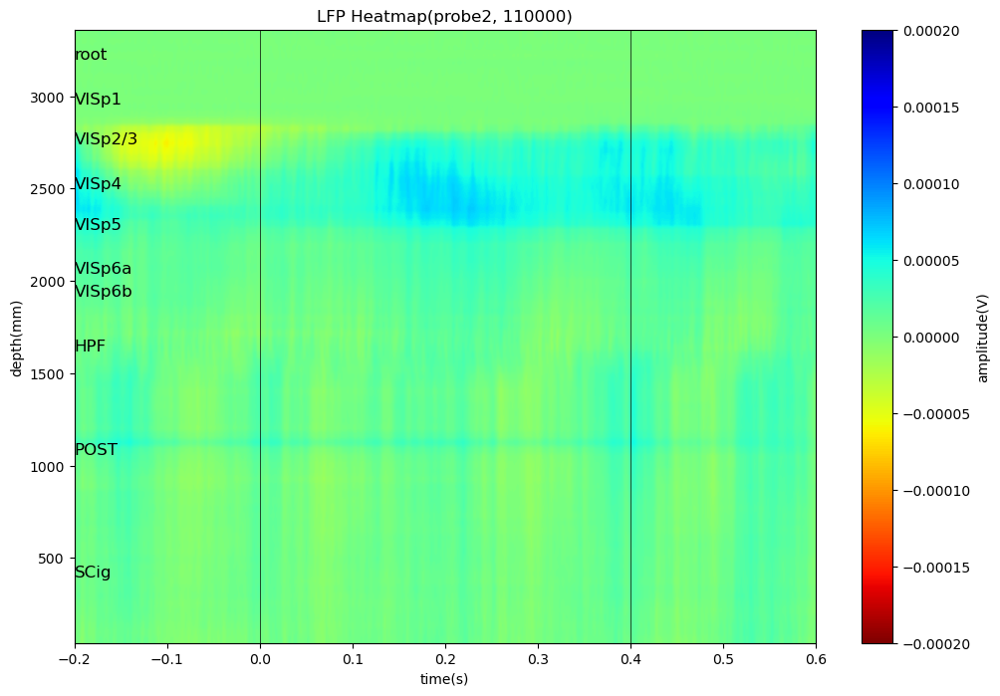

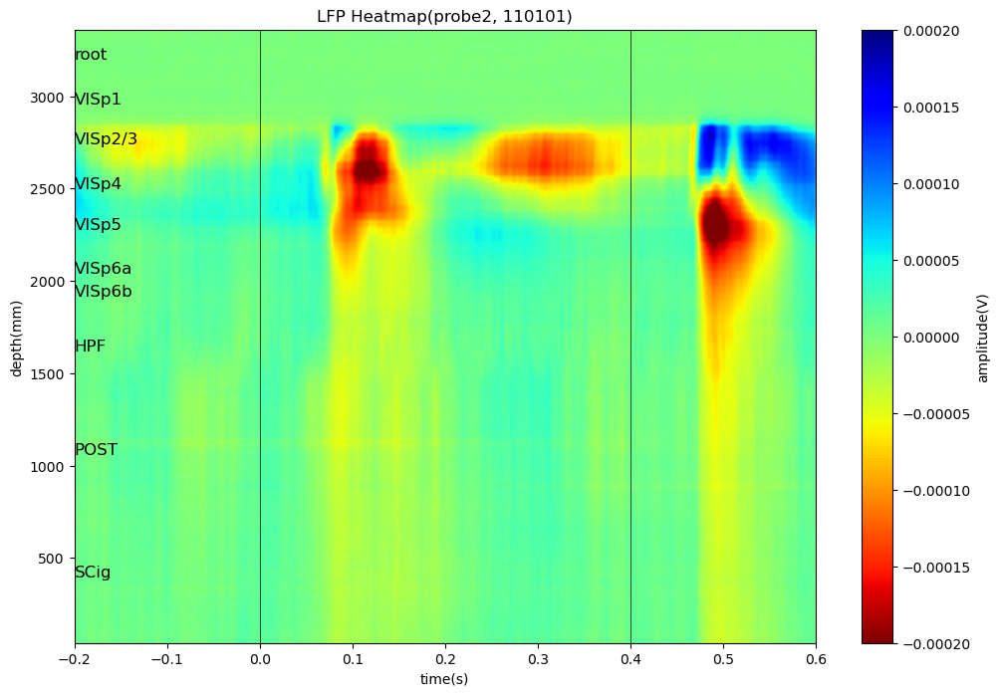

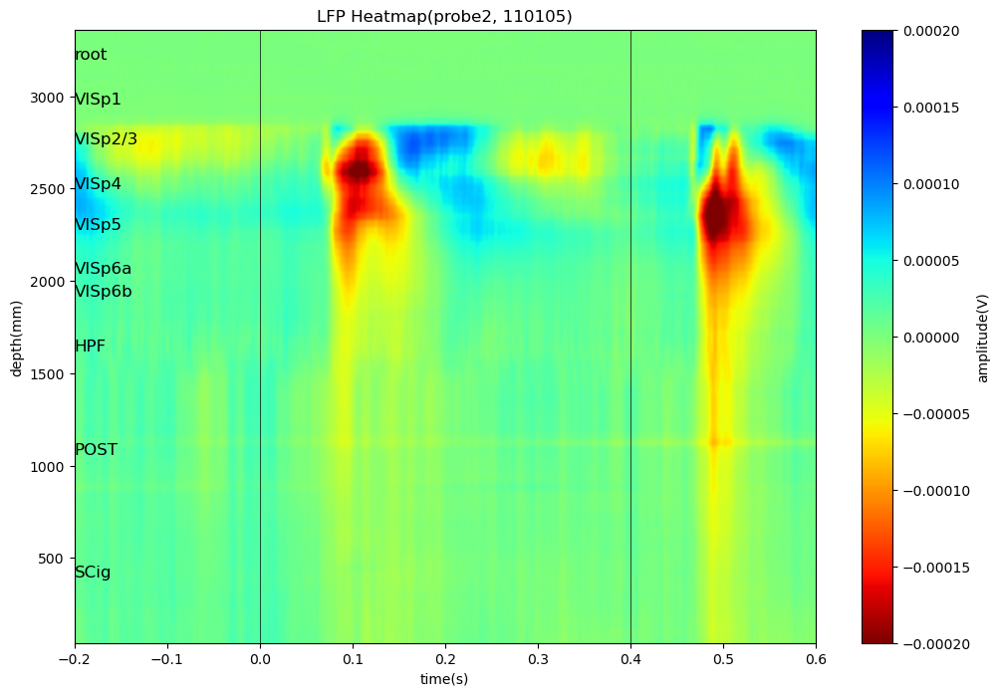

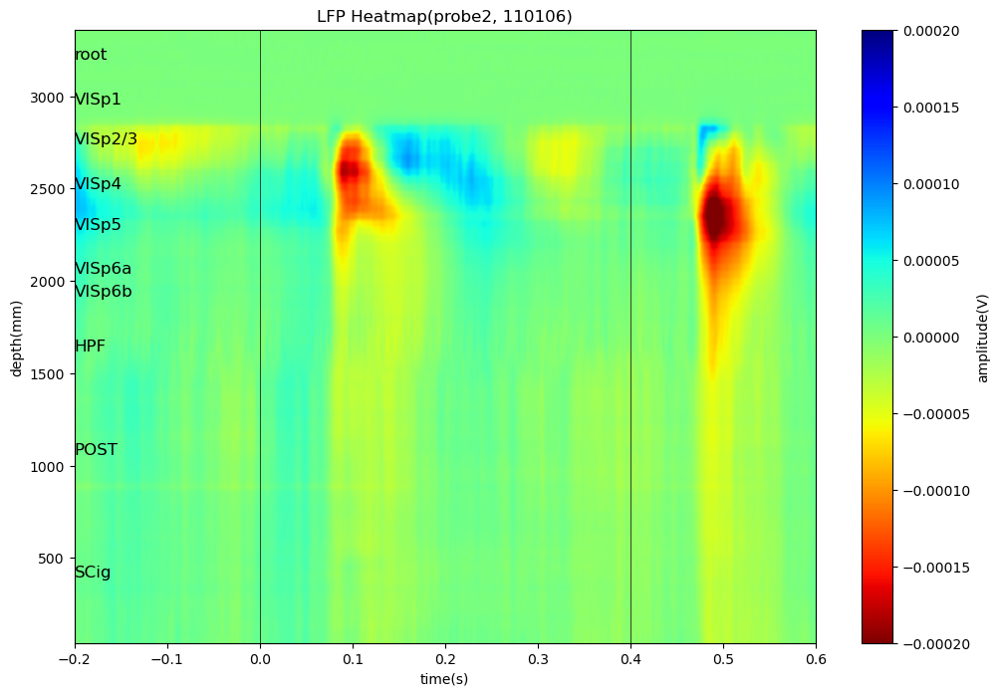

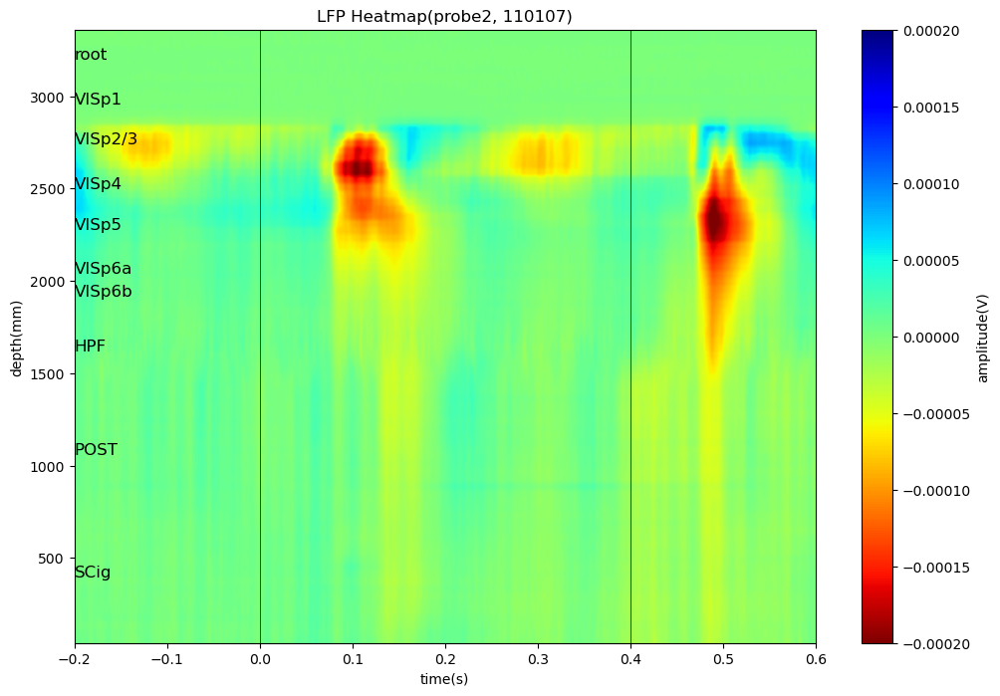

...

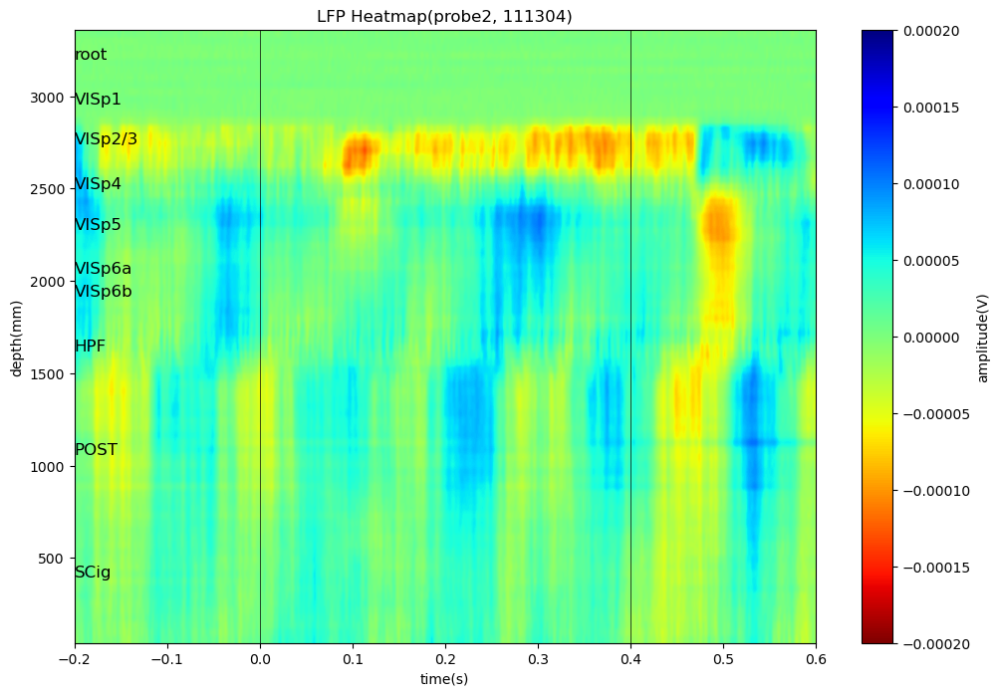

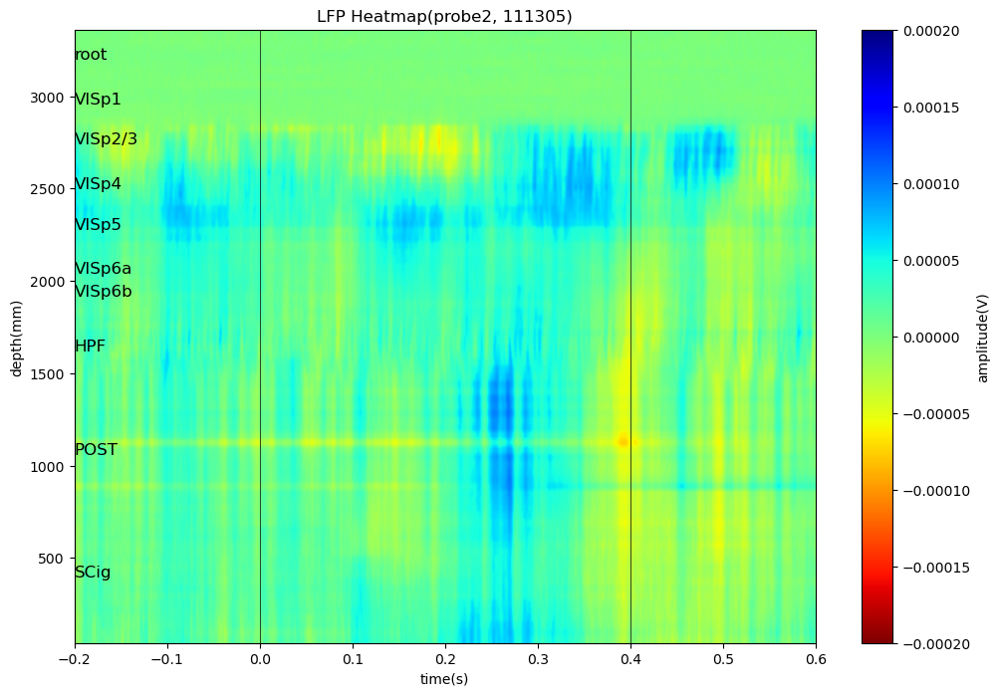

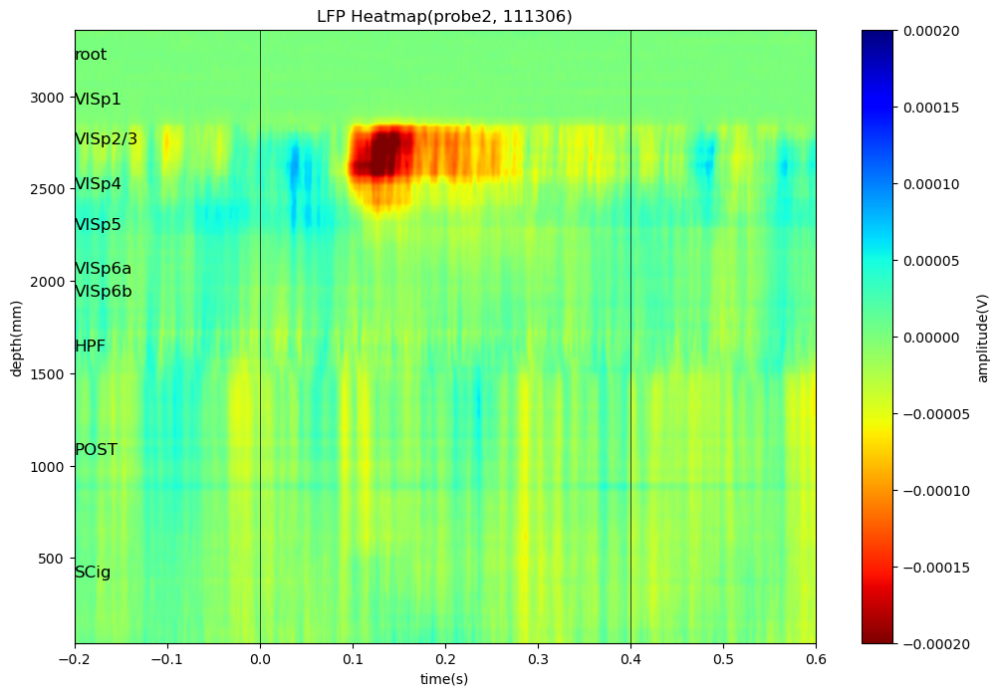

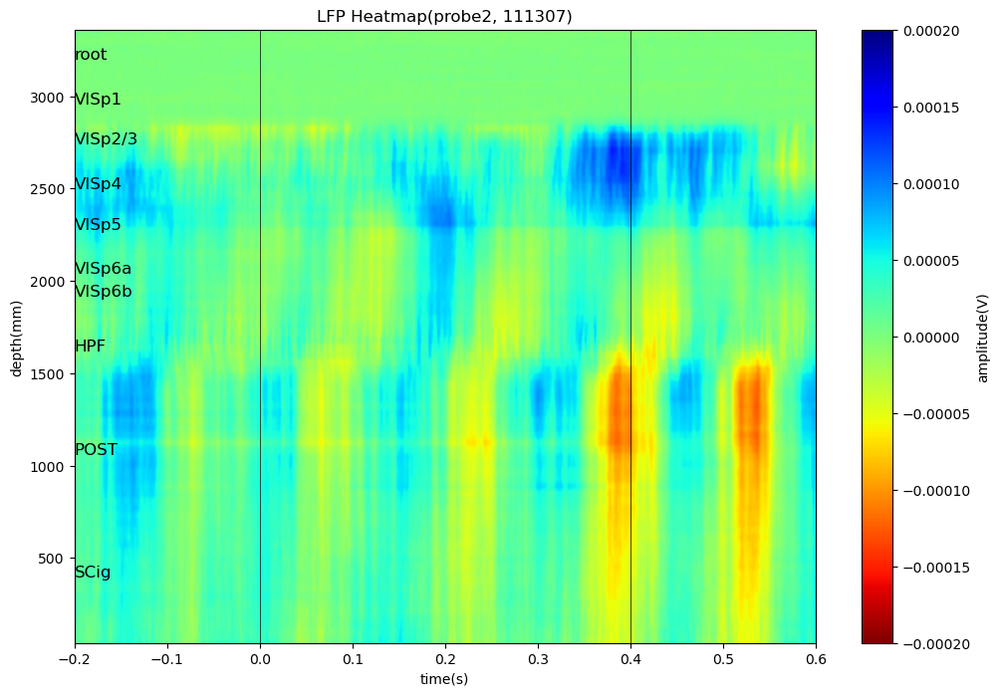

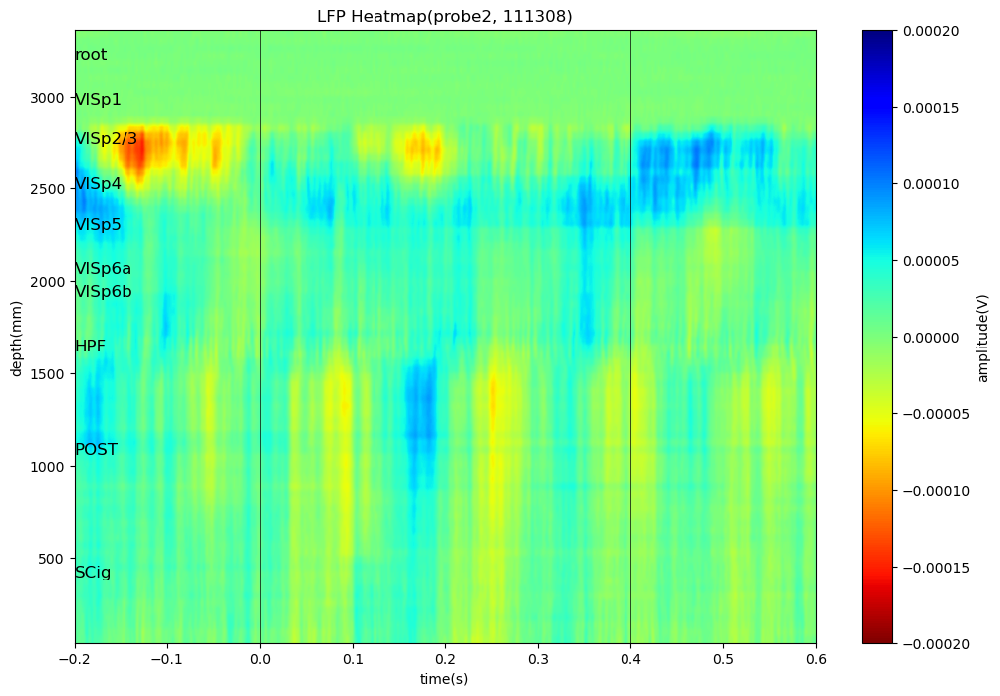

In [19]:
#Butterworth filter
def butter_lowpass(order, cutoff, fs) :
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = scipy.signal.butter(order, normal_cutoff, btype = 'low')
    return b, a
#end of butter_lowpass
order = 5
cutoff_frequency = 200.0
sampling_frequency = interp_hz

butter_b, butter_a = butter_lowpass(order, cutoff_frequency, sampling_frequency)

# filtered_average_trace = np.zeros_like(average_trace)
# for channel in range(average_trace.shape[1]) :
#     filtered_average_trace[:, channel] = scipy.signal.filtfilt(butter_b, butter_a, average_trace[:, channel])
filtered_windows = []
filtered_average_trace = []
filtered_stim_windows = []
for frame_num in range(len(stim_num)):
    filtered_windows.append(scipy.signal.filtfilt(butter_b, butter_a, windows[frame_num], axis = 1))
    filtered_average_trace.append(np.average(filtered_windows[frame_num], axis=0))
    filtered_stim_windows.append(scipy.signal.filtfilt(butter_b, butter_a, stim_windows[frame_num], axis = 1))

for frame_num in range(len(stim_num)) :
    plt.figure(figsize=(12,8))
    norm = mpl.colors.Normalize(vmin=-0.0002, vmax=0.0002)
    xaxis = np.linspace(window_start_time, window_end_time, len(filtered_average_trace[frame_num]))
    depth = np.array(lfp.electrodes["probe_vertical_position"][start_channel:end_channel])
    im = plt.imshow(filtered_average_trace[frame_num][:,start_channel:end_channel].T,aspect='auto',origin='lower', extent=[xaxis.min(), xaxis.max(), depth.min(), depth.max()], norm=norm)
    cb = plt.colorbar(im, label="amplitude(V)")
    plt.set_cmap('jet_r')
    plt.xlabel('time(s)')
    plt.ylabel('depth(mm)')
    plt.title('LFP Heatmap(probe'+ str(probe_num) +', '+ str(stim_num[frame_num]) +')')

    for loc, ypos in loc_pos :
        plt.text(xaxis.min(), ypos, loc, fontsize=12)
    plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    plt.axvline(0.4, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '../material/LFP_trace_all/LFP_110000.jpg'

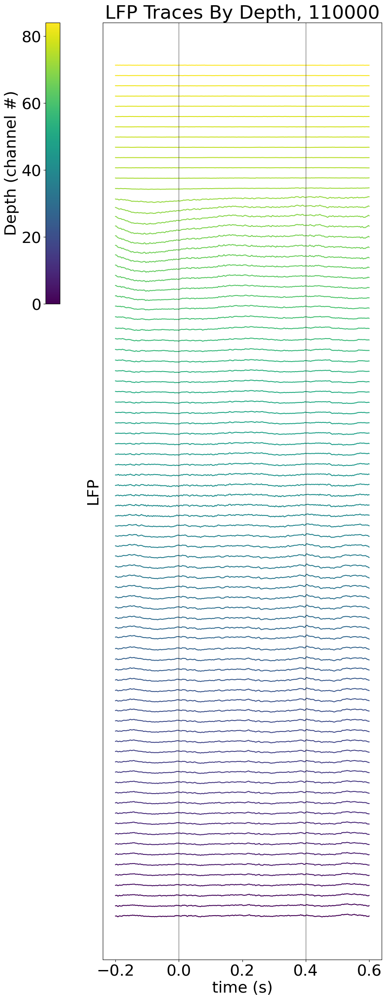

In [222]:
frame_stimtype = [(0, '0'), (3, 'IC1'), (7, 'IC2'), (4, 'LC1'), (6, 'LC2'), (8, 'IRE1'), (9, 'IRE2')]
    
for frame_num in range(len(stim_num)) :
    # Change this if the visualization below looks messy. The larger value the flatter
    amp_res = 0.00012

    colors = plt.cm.viridis(np.linspace(0, 1, n_channels))
    fig, ax = plt.subplots(figsize=(10, n_channels/3))

    for i, channel in enumerate(range(start_channel, end_channel)):
        offset_trace = filtered_average_trace[frame_num][:,channel] + i*amp_res
        plot = ax.plot(xaxis, offset_trace, color=colors[i])

    norm = mpl.colors.Normalize(vmin=start_channel, vmax=end_channel)
    cb = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=plt.cm.viridis), location="left", pad = 0.02, anchor=(0,1), shrink=0.3, ax=ax, label='Depth (channel #)')
    ax.yaxis.set_ticks([])
    plt.xlabel("time (s)")
    plt.ylabel("LFP")
    plt.title("LFP Traces By Depth, " + str(stim_num[frame_num]))
    plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    plt.axvline(0.4, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    plt.rc('font', size=26)
    plt.savefig(f'../material/LFP_trace_all/LFP_{stim_num[frame_num]}.jpg', format='jpeg')
    plt.close()


In [20]:
def compute_csd(lfp, method = 'delta', gauss_filter = (1.4,0), coord_electrodes = np.linspace(0,1000E-6,23) * pq.m,\
                diam = 800E-6 * pq.m, sigma = 0.3*pq.S/pq.m, sigma_top = 0.3*pq.S/pq.m, h = 40*1E-6*pq.m, mode = 'sim'):
    
    '''
    This function computes CSD from LFP using the delta iCSD (https://doi.org/10.1016/j.jneumeth.2005.12.005)
    Parameters
    ---------
        lfp : local field potential
        method : method by which CSD is calculated in iCSD
        gauss_filter : smoothing parameter, given in sigma
        coord_electrodes : depth of electrodes on probe
        diam : diameter of laterally constant CSD assumed
        sigma : conductivity in extracellular medium
        sigma_top : conductivity in extracellular medium at top channel
        h : spacing between electrodes
        mode : indicates whether it is calculated for simulation or experimental LFP
    Returns
    ---------
        csd : current source density
    '''

    # simulation LFP is given in mV, while experimental LFP is given in V
    if mode == 'sim':
        lfp = lfp*1E-3*pq.V
    elif mode == 'exp':
        lfp = lfp*pq.V
    else:
        lfp = lfp*1E-3*pq.V
    
    delta_input = {
    'lfp' : lfp,
    'coord_electrode' : coord_electrodes,
    'diam' : diam,
    'sigma' : sigma,
    'sigma_top' : sigma_top,
    'f_type' : 'gaussian',  # gaussian filter. Not used
    'f_order' : (0, 0),     # 3-point filter
    }
    
    step_input = {
    'lfp' : lfp,
    'coord_electrode' : coord_electrodes,
    'diam' : diam,
    'h' : h,
    'sigma' : sigma,
    'sigma_top' : sigma_top,
    'tol' : 1E-12,          # Tolerance in numerical integration
    'f_type' : 'gaussian',
    'f_order' : (3, 1),
    }
    
    spline_input = {
    'lfp' : lfp,
    'coord_electrode' : coord_electrodes,
    'diam' : diam,
    'sigma' : sigma,
    'sigma_top' : sigma_top,
    'num_steps' : len(coord_electrodes)*4,      # Spatial CSD upsampling to N steps
    'tol' : 1E-12,
    'f_type' : 'gaussian',
    'f_order' : (20, 5),
    }

    if method == 'delta':
        csd_dict = dict(
            delta_icsd = icsd.DeltaiCSD(**delta_input)
        )
    elif method == 'step':
        csd_dict = dict(
            step_icsd = icsd.StepiCSD(**step_input)
        )
    elif method == 'spline':
        csd_dict = dict(
            spline_icsd = icsd.SplineiCSD(**spline_input)
        )
        
    #TODO: Set up the input for the other methods
    '''elif method == 'step':
        step_icsd = icsd.StepiCSD(**step_input),
    elif method == 'spline':
        spline_icsd = icsd.SplineiCSD(**spline_input),
    elif method == 'standard':
        std_csd = icsd.StandardCSD(**std_input),'''
  

    for method_, csd_obj in list(csd_dict.items()):
        csd_raw = csd_obj.get_csd()
        
    # Converting from planar to volume density
    if method == 'delta':
        csd_raw = csd_raw / h
        
    # Apply spatial filtering
    csd = gaussian_filter(csd_raw, sigma = gauss_filter)*csd_raw.units
    
    return csd

In [147]:
for frame_num in range(len(stim_num)) : 
    filt_csd = compute_csd(filtered_average_trace[frame_num][:,start_channel:end_channel].T, coord_electrodes = np.linspace(0,1000E-6,n_channels) * pq.m)
    plt.figure(figsize=(12,4))
    norm = mpl.colors.Normalize(vmin = -12.5, vmax = 12.5)
    xaxis = np.linspace(window_start_time, window_end_time, filt_csd.shape[1])
    depth =  np.array(lfp.electrodes["probe_vertical_position"][start_channel+1:end_channel-1])
    im = plt.imshow(filt_csd, aspect = 'auto', origin = 'lower', extent=[xaxis.min(), xaxis.max(), depth.min(), depth.max()], norm=norm)
    cb = plt.colorbar(im, label=r"($\mu A/mm^3$)")
    plt.set_cmap('jet_r')
    plt.xlabel('time(s)')
    plt.ylabel('depth(mm)')
    plt.title('CSD Heatmap(probe'+ str(probe_num) +', '+ str(stim_num[frame_num]) +')')
    for loc, ypos in loc_pos :
        #if ypos > depth.min() and ypos < depth.max() : plt.text(0, ypos, loc, fontsize=21)
        plt.text(xaxis.min(), ypos, loc, fontsize=12)

    plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    plt.axvline(0.4, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    print(frame_num)
    plt.savefig(f'../material/CSD_Heatmap_probe{probe_num}/CSD_Heatmap_probe{probe_num}_{stim_num[frame_num]}.jpg', format='jpeg')
    #plt.plot()
    plt.close()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21


In [108]:
from scipy.ndimage import maximum_filter, minimum_filter

def find_local_extrema(data, threshold_ratio=30):
    # Define the neighborhood size for the filter
    neighborhood_size = 8

    # Calculate the threshold value using the median
    median_value = np.median(np.abs(data))
    threshold = median_value * threshold_ratio

    # Apply maximum and minimum filters
    local_max = maximum_filter(data, neighborhood_size) == data
    local_min = minimum_filter(data, neighborhood_size) == data

    # Apply threshold condition
    local_max &= (data >= threshold)
    local_min &= (data <= -threshold)

    # Remove the border effect by setting edges to False
    local_max[:neighborhood_size//2, :] = False
    local_max[-neighborhood_size//2:, :] = False
    local_max[:, :neighborhood_size//2] = False
    local_max[:, -neighborhood_size//2:] = False

    local_min[:neighborhood_size//2, :] = False
    local_min[-neighborhood_size//2:, :] = False
    local_min[:, :neighborhood_size//2] = False
    local_min[:, -neighborhood_size//2:] = False

    return local_max, local_min

In [109]:
##그냥 local max가 아니라 0~0.4s 구간에서 최대/최소값인 부분 표시하는게 나을지도
frame_stimtype = [(0, '0'), (3, 'IC1'), (7, 'IC2'), (4, 'LC1'), (6, 'LC2'), (8, 'IRE1'), (9, 'IRE2'), (10, 'TRE1'), (11, 'TRE2')]
for frame_num, stim_type in frame_stimtype :
    filt_csd = compute_csd(filtered_average_trace[frame_num][:,start_channel:end_channel].T, coord_electrodes = np.linspace(0,1000E-6,n_channels) * pq.m)
    plt.figure(figsize=(8,4))
    norm = mpl.colors.Normalize(vmin = -12, vmax = 12)
    xaxis = np.linspace(window_start_time, window_end_time, filt_csd.shape[1])
    depth =  np.array(lfp.electrodes["probe_vertical_position"][start_channel+1:end_channel-1])
    im = plt.imshow(filt_csd, aspect = 'auto', origin = 'lower', extent=[xaxis.min(), xaxis.max(), depth.min(), depth.max()], norm=norm)
    cb = plt.colorbar(im, label=r"($\mu A/mm^3$)")
    plt.set_cmap('jet_r')
    plt.xlabel('time(s)')
    plt.gca().axes.yaxis.set_visible(False)
    plt.title('CSD Heatmap(AL, '+ stim_type +')')
    for loc, ypos in loc_pos :
        plt.text(xaxis.min(), ypos, loc, fontsize=12)
        plt.axhline(ypos, 0, 1, color = 'black', linestyle = '--', linewidth = 0.5)
    plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    plt.axvline(0.4, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    for btime in range(-200, 600, 5) :
        plt.axvline(btime/1000, 0, 1, color = 'gray', linestyle = 'solid', linewidth = 0.5)
    plt.rc('font', size=26)
    
    # local_max, local_min = find_local_extrema(filt_csd)
    # max_coords = np.argwhere(local_max)
    # min_coords = np.argwhere(local_min)
    # 
    # print(stim_type)
    # print("max_xaxis, max_depth")
    # for coord in max_coords:
    #     plt.scatter(xaxis[coord[1]], depth[coord[0]-1], color = 'r', marker = 'x', s=10)  # Red circle for maxima
    #     print(xaxis[coord[1]], depth[coord[0]-1])
    # print("min_xaxis, min_depth")
    # for coord in min_coords:
    #     plt.scatter(xaxis[coord[1]], depth[coord[0]-1], color = 'b', marker = 'x', s=10)  # Blue circle for minima
    #     print(xaxis[coord[1]], depth[coord[0]-1])
    print(stim_type)
    a = filt_csd[:, 200:600]
    median_value = np.median(np.abs(a))
    threshold = median_value * 15
    
    max_index = np.unravel_index(a.argmax(), a.shape)
    print("max_xaxis, max_depth")
    if a.max() >= threshold :
        print(max_index)
        plt.scatter(xaxis[max_index[1]+200], depth[max_index[0]-2], color = 'r', marker = 'x', s=10)
    
    min_index = np.unravel_index(a.argmin(), a.shape)
    print("min_xaxis, min_depth")
    if a.min() <= - threshold :
        print(min_index)
        plt.scatter(xaxis[min_index[1]+200], depth[min_index[0]-2], color = 'b', marker = 'x', s=10)
    
    
    plt.savefig(f'../material/CSD_Heatmap_probe{probe_num}/CSD_Heatmap_{stim_type}.jpg', format='jpeg')
    #plt.plot()
    plt.close()

0
max_xaxis, max_depth
(68, 373)
min_xaxis, min_depth
(71, 171)
IC1
max_xaxis, max_depth
(70, 87)
min_xaxis, min_depth
(64, 88)
IC2
max_xaxis, max_depth
(71, 95)
min_xaxis, min_depth
(65, 90)
LC1
max_xaxis, max_depth
(71, 106)
min_xaxis, min_depth
(65, 91)
LC2
max_xaxis, max_depth
(70, 84)
min_xaxis, min_depth
(67, 132)
IRE1
max_xaxis, max_depth
(72, 89)
min_xaxis, min_depth
(68, 88)
IRE2
max_xaxis, max_depth
(71, 86)
min_xaxis, min_depth
(68, 88)
TRE1
max_xaxis, max_depth
(71, 86)
min_xaxis, min_depth
(68, 89)
TRE2
max_xaxis, max_depth
(71, 86)
min_xaxis, min_depth
(68, 87)


In [110]:
for i in range(len(filtered_average_trace)) :
    print(filtered_average_trace[i].shape)
    #print(windows[i][trial_num, :, :].shape)
    print(filt_csd.shape)

(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)
(800, 84)
(84, 800)


In [263]:
data = [] # (trial #, time, channel)
labels = []
for frame_num, stimtype in frame_stimtype :
    for trial_num in range(windows[frame_num].shape[0]) :
        temp_data = compute_csd(windows[frame_num][trial_num,:,start_channel:end_channel].T, coord_electrodes = np.linspace(0,1000E-6,n_channels) * pq.m)
        data.append(temp_data)
        labels.append(frame_num)

data = np.array(data)
labels = np.array(labels)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [268]:
print(data.shape)
print(labels.shape)

(2100, 84, 800)
(2100,)


In [269]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import KFold
import numpy as np

class CSDDataset(Dataset):
    def __init__(self, data, labels):
        self.data = torch.tensor(data, dtype=torch.float32).unsqueeze(1)  # (2100, 84, 800) -> (2100, 1, 84, 800)
        self.labels = torch.tensor(labels, dtype=torch.long)
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]

# 개선된 CNN 모델 정의
class ImprovedCNN(nn.Module):
    def __init__(self):
        super(ImprovedCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=7, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=5, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.relu = nn.ReLU()
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)
        self.dropout = nn.Dropout(0.5)
        
        self.fc_input_dim = 128 * (84 // 8) * (800 // 8)  # 세 번의 max pooling 후의 크기

        self.fc1 = nn.Linear(self.fc_input_dim, 256)
        self.fc2 = nn.Linear(256, 23)  # 출력 차원을 23으로 설정

    def forward(self, x):
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = x.view(x.size(0), -1)  # flatten
        x = self.dropout(self.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

def train_and_evaluate(train_loader, val_loader, model, criterion, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        model.train()
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
        
        model.eval()
        val_loss = 0
        correct = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                val_loss += criterion(outputs, labels).item()
                pred = outputs.argmax(dim=1, keepdim=True)
                correct += pred.eq(labels.view_as(pred)).sum().item()
        
        val_loss /= len(val_loader.dataset)
        accuracy = correct / len(val_loader.dataset)
        print(f'Epoch {epoch+1}/{num_epochs}, Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

kf = KFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_idx, val_idx) in enumerate(kf.split(data)):
    print(f'Fold {fold+1}')
    train_data, val_data = data[train_idx], data[val_idx]
    train_labels, val_labels = labels[train_idx], labels[val_idx]
    
    train_dataset = CSDDataset(train_data, train_labels)
    val_dataset = CSDDataset(val_data, val_labels)
    
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    model = ImprovedCNN()
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    train_and_evaluate(train_loader, val_loader, model, criterion, optimizer)

# 테스트 데이터로 최종 평가 (사용자 데이터에 맞게 추가)

Fold 1
Epoch 1/10, Validation Loss: 0.1046, Accuracy: 0.0429
Epoch 2/10, Validation Loss: 0.1046, Accuracy: 0.0405
Epoch 3/10, Validation Loss: 0.1046, Accuracy: 0.0405
Epoch 4/10, Validation Loss: 0.1046, Accuracy: 0.0405
Epoch 5/10, Validation Loss: 0.1046, Accuracy: 0.0405
Epoch 6/10, Validation Loss: 0.1046, Accuracy: 0.0405
Epoch 7/10, Validation Loss: 0.1046, Accuracy: 0.0405
Epoch 8/10, Validation Loss: 0.1046, Accuracy: 0.0405
Epoch 9/10, Validation Loss: 0.1046, Accuracy: 0.0405
Epoch 10/10, Validation Loss: 0.1046, Accuracy: 0.0405
Fold 2
Epoch 1/10, Validation Loss: 0.1046, Accuracy: 0.0429
Epoch 2/10, Validation Loss: 0.1046, Accuracy: 0.0571
Epoch 3/10, Validation Loss: 0.1046, Accuracy: 0.0571
Epoch 4/10, Validation Loss: 0.1046, Accuracy: 0.0571
Epoch 5/10, Validation Loss: 0.1046, Accuracy: 0.0571
Epoch 6/10, Validation Loss: 0.1046, Accuracy: 0.0571
Epoch 7/10, Validation Loss: 0.1045, Accuracy: 0.0571
Epoch 8/10, Validation Loss: 0.1046, Accuracy: 0.0571
Epoch 9/10, V

In [28]:
for frame_num in range(len(stim_num)) : 
    filt_csd = compute_csd(filtered_average_trace[frame_num][:,start_channel:end_channel].T, coord_electrodes = np.linspace(0,1000E-6,n_channels) * pq.m)
    plt.figure(figsize=(12,4))
    norm = mpl.colors.Normalize(vmin = -2.5, vmax = 2.5)
    xaxis = np.linspace(window_start_time, window_end_time, filt_csd.shape[1])
    depth =  np.array(lfp.electrodes["probe_vertical_position"][start_channel+1:end_channel-1])
    im = plt.imshow(filt_csd, aspect = 'auto', origin = 'lower', extent=[xaxis.min(), xaxis.max(), depth.min(), depth.max()], norm=norm)
    cb = plt.colorbar(im, label=r"($\mu A/mm^3$)")
    plt.set_cmap('bwr')
    plt.xlabel('time(s)')
    plt.ylabel('depth(mm)')
    plt.title('CSD Heatmap(probe'+ str(probe_num) +', '+ str(stim_num[frame_num]) +')')
    for loc, ypos in loc_pos :
        #if ypos > depth.min() and ypos < depth.max() : plt.text(0, ypos, loc, fontsize=21)
        plt.text(xaxis.min(), ypos, loc, fontsize=12)

    plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    #plt.axvline(0.4, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
    print(frame_num)
    plt.savefig(f'../material/CSD_Heatmap_probe{probe_num}/CSD_Heatmap_probe{probe_num}_{stim_num[frame_num]}_bwr.jpg', format='jpeg')
    #plt.plot()
    plt.close()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21


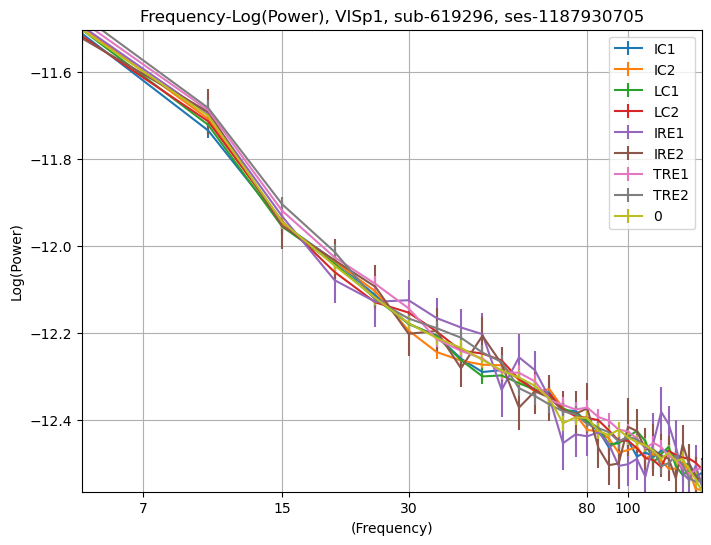

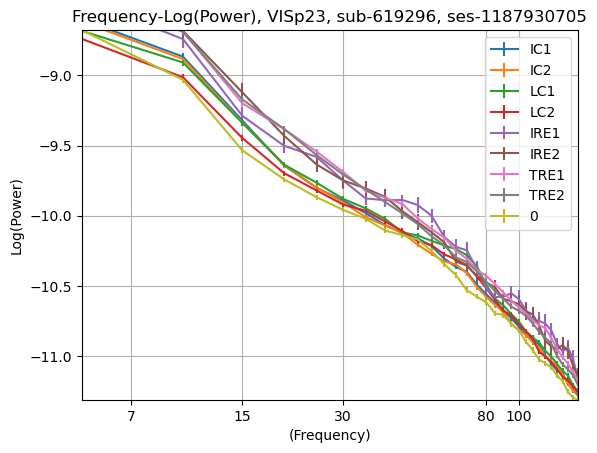

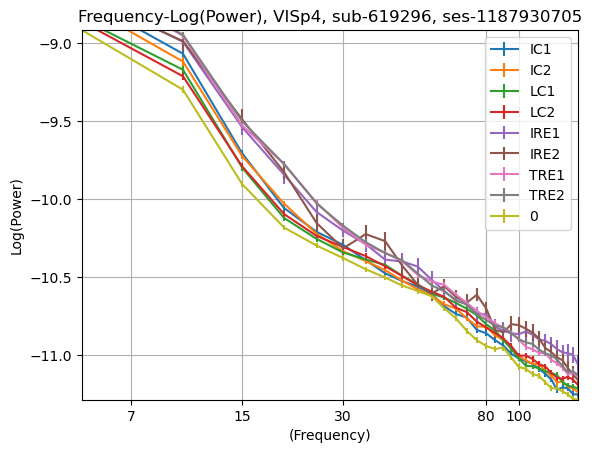

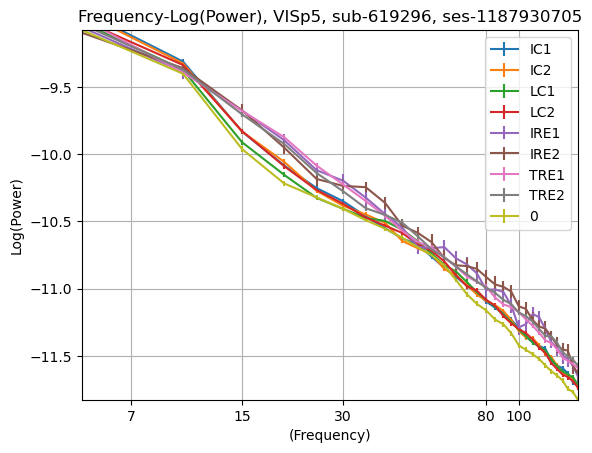

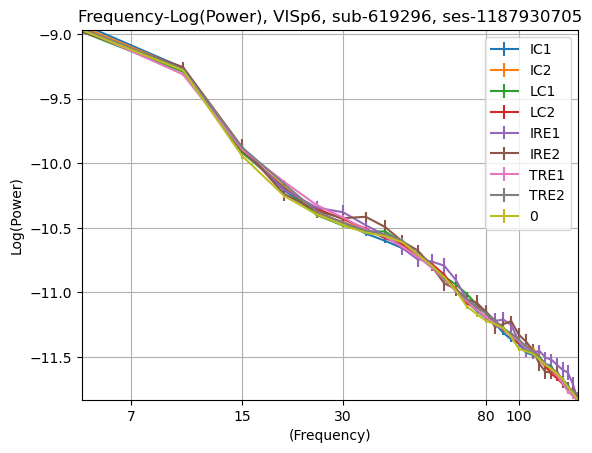

In [55]:
#frame_num : type 
#3, IC1, 4, LC1, 6, LC2, 7, IC2, 8, IRE1, 9, IRE2
# Import spectral power functions
from neurodsp.spectral import compute_spectrum, rotate_powerlaw

# Import utilities for loading and plotting data
from neurodsp.utils import create_times
from neurodsp.utils.download import load_ndsp_data
from neurodsp.plts.spectral import plot_power_spectra
from neurodsp.plts.time_series import plot_time_series

from scipy.stats import sem

frame_stimtype = [(3, 'IC1'), (7, 'IC2'), (4, 'LC1'), (6, 'LC2'), (8, 'IRE1'), (9, 'IRE2'), (10, 'TRE1'), (11, 'TRE2'), (0, '0')]

rep_window_loc = [(73, "VISp1"), (67, "VISp23"), (61, "VISp4"), (56, "VISp5"), (49, "VISp6")]
fs = 1000
target_windows = filtered_stim_windows
target_channel = 61


# Plot the loaded signal
#plot_time_series(times, sig, xlim=[0, 1.2])

# plt.figure(figsize=(8, 6))

# for channel, layer in rep_window_loc :
#     psds_list = []
#     for trial in range(target_windows.shape[0]) :
#         dspsig = target_windows[trial, :, channel]
#         freq_mean, psd_mean = compute_spectrum(dspsig, fs, method='welch', avg_type='mean', nperseg=fs*0.4)
#         psds_list.append(psd_mean)
#     psds = np.array(psds_list)
#     psd_average = np.average(psds, axis = 0)
#     #print(psd_average.shape)
#     plt.plot(np.log10(freq_mean[1:]), np.log10(psd_average[1:]), label = layer)
# plt.xlim(np.log10(freq_mean[1]), 2)
#     #plt.xscale('log')
# plt.xticks([np.log10(8), np.log10(12), np.log10(30), np.log10(60)], [8, 12, 30, 60])
# plt.xlabel('(Frequency)')
# plt.ylabel('Log(Power)')
# plt.title('Frequency-Log(Power)')
# plt.grid(True)
# plt.legend()
# plt.ylim([-13, -7.5])
# plt.show()
#     #plot_power_spectra(freq_mean, psd_average, 'Welch')

plt.figure(figsize=(8, 6))

for channel, layer in rep_window_loc :
    for frame_num, stimtype in frame_stimtype :
        times = create_times(target_windows[frame_num].shape[1]/fs, fs)
        psds_list = []
        for trial in range(target_windows[frame_num].shape[0]) :
            dspsig = target_windows[frame_num][trial, :, channel]
            freq_mean, psd_mean = compute_spectrum(dspsig, fs, method='welch', avg_type='mean', nperseg=fs*0.2)
            psds_list.append(psd_mean)
        psds = np.array(psds_list)
        psd_average = np.average(psds, axis = 0)
        #print(psd_average.shape)
        plt.errorbar(np.log10(freq_mean[1:]), np.log10(psd_average[1:]), yerr = sem(np.log10(psds))[1:], label = stimtype)
    plt.xlim(np.log10(freq_mean[1]), np.log10(150))
    plt.xticks([np.log10(7), np.log10(15), np.log10(30), np.log10(80), np.log10(100)], [7, 15, 30, 80, 100])
    plt.xlabel('(Frequency)')
    plt.ylabel('Log(Power)')
    plt.title('Frequency-Log(Power), ' + layer + ", " + sub_sessions[0][0] + ", " + sub_sessions[0][1])
    plt.grid(True)
    plt.legend()
    plt.ylim([np.log10(psd_average[30]), np.log10(psd_average[1])])
    plt.savefig(f'../material/PSD/PSD_{layer}_{sub_sessions[0][0]}_{sub_sessions[0][1]}.jpg', format='jpeg')
    plt.show()
    
    
# for trial in range(target_windows[frame_num].shape[0]) :
#     dspsig = target_windows[frame_num][trial, :, target_channel]
#     freq_mean, psd_mean = compute_spectrum(dspsig, fs, method='welch', avg_type='mean', nperseg=fs*0.4)
#     psds_list.append(psd_mean)
# psds = np.array(psds_list)
# psd_average = np.average(psds, axis = 0)
# # Initialize FOOOF object
# fm = FOOOF()

# # Define frequency range across which to model the spectrum
# freq_range = [0, 200]

# # Model the power spectrum with FOOOF, and print out a report
# #for i in range(psd.shape[1]):
# #    fm.report(freqs, psd[:, i], freq_range)
# # fig = fm.report(freq_mean, psd_average, freq_range, plt_log=True)

# fm.fit(freq_mean, psd_average, freq_range)
# fig = fm.plot(plt_log = True)

# #plot_annotated_model(fm, plt_log=True)

In [30]:
# #spectrogram
# sig = stim_windows[:, :, start_channel:end_channel]
# fs = interp_hz
# nsc = 64 #math.floor(50e-3*fs);           
# nov = math.floor(nsc*0.90);         
# nff = 2**12;     
# sig_rep_channel_list = [(26, 'VISp1'), (20, 'VISp2/3'), (14, 'VISp4'), (9, 'VISp5'), (3, 'VISp6')]
# f,t,Sxx = scipy.signal.spectrogram(sig, fs=fs, window=np.hanning(nsc), 
#                              noverlap=nov, nperseg=nsc, nfft=nff, mode='complex', axis=1) #mode = 'complex': MATLAB의 spectrogram과 동일한 결과를 만들어냄
# print(Sxx.shape)
# average_Sxx = np.average(Sxx, axis = 0)

# for i, layer in sig_rep_channel_list :
    
#     Sxx_reshaped = np.abs(average_Sxx[:, i, :])
#     fig1 = plt.figure()
#     norm = mpl.colors.Normalize(vmin = -105, vmax = -50)
#     im1= plt.pcolormesh(t,f,10*np.log10(np.abs(Sxx_reshaped)), cmap='jet', norm=norm)
#     fig1.colorbar(im1).set_label('Intensity (dB)')
#     plt.xlabel('Time [sec]')
#     plt.ylabel('Frequency [Hz]')
#     plt.ylim(0,100)
#     plt.title(layer +', '+ str(stim_num[frame_num]))
#     plt.show()

In [31]:
%matplotlib inline

import sys
import os.path as op
from glob import glob
# import seaborn as sns
# sns.set()

# set path to SpectralEvents if necessary
# sys.path.append('/PATH/TO/FOLDER/SpectralEvents')
import spectralevents as se

In [32]:
def plot_events_p(tfr, times, freqs, event_band, spec_events=None,
                timeseries=None, ax=None, vlim=None, ylim_ts=None, label=None):

    if tfr.shape != (len(freqs), len(times)):
        raise ValueError(f'tfr must be an array of shape (n_freqs, n_times), '
                         f'got tfr: {tfr.shape}, freqs: ({len(freqs)},), '
                         f'times: ({len(times)},)')

    if vlim is None:
        vlim = [None, None]

    # convert to numpy array if not already
    freqs = np.array(freqs)

    # frequencies within the band of interest
    # band_mask = np.logical_and(freqs >= event_band[0],
    #                            freqs <= event_band[1])

    if ax is None:
        fig, ax = plt.subplots(1, 1)
    else:
        fig = ax.get_figure()

    # plot tfr
    im = ax.pcolormesh(times, freqs, tfr, cmap='jet', vmin=vlim[0],
                       vmax=vlim[1], shading='nearest')
    fig.colorbar(im, ax=ax)
    ax.axhline(y=event_band[0], c='w', linewidth=2., linestyle='-')
    ax.axhline(y=event_band[1], c='w', linewidth=2., linestyle='-')
    ax.set_yticks([freqs[0], event_band[0], event_band[1], freqs[-1]])
    ax.set_xlim(times[0], times[-1])

    # overlay with timecourse
    # twin axis needs to be created and yticks set regardless of if a
    # timeseries is provided to ensure consistency with seaborn tick formatting
    ax_twin = ax.twinx()
    ax_twin.set_yticks([])
    if timeseries is not None:
        ax_twin.plot(times, timeseries, 'w', linewidth=1., alpha=0.8)

        if ylim_ts is not None:
            ax_twin.set_ylim(ylim_ts[0], ylim_ts[1])

    # plot event locations
    if spec_events is not None:
        event_times = [event['Peak Time'] for event in spec_events]
        event_freqs = [event['Peak Frequency'] for event in spec_events]
        # reverse sigmoid: make scatter markers more transparent when there are
        # more of them
        alpha = lambda x : (0.6 + 0.4 * np.exp(-0.2 * (x - 30))  # noqa
                            / (1 + np.exp(-0.2 * (x - 30))))  # noqa
        ax.scatter(event_times, event_freqs, s=20, c='w', marker='x',
                   alpha=alpha(len(spec_events)))

    # add label on top of spectrogram plot
    if label is not None:
        ax.annotate(label, xy=(0.01, 0.98), xycoords='axes fraction',
                    va='top', ha='left', color='w', size=10, fontweight='bold')

    return fig

def plot_avg_spectrogram_p(tfr, times, freqs, event_band, spec_events=None,
                         timeseries=None, example_epochs=None, vlim=None,
                         show_events=False):
    '''Plot the average spectrogram over all TFR epochs/trials.

    Parameters
    ----------
    tfr : array, shape (n_epochs, n_freqs, n_times)
        A stack of time-frequency response (TFR) epochs/trials.
    times : array-like, shape (n_times,)
        Time domain of each TFR in seconds.
    freqs : array-like, shape (n_freqs,)
        Frequency domain of each TFR in Hertz.
    event_band : list
        Lower and upper bounds (inclusive, Hz) of the frequency band-of-
        interest in which spectral events were detected.
    spec_events : list of list of dict
        A nested list with n_epochs elements in the outer list and n_events in
        the inner list. Each inner element comprises an event that is
        characterized by dictionary items including it's location in time,
        location in frequency, duration, and frequency span, and more. If None,
        no events are plotted.
    timeseries : array, shape (n_epochs, n_times) | None
        The stack of timeseries associated with the TFR epochs/trials.
    example_epochs : list | None
        The epoch/trial indices that will be used to plot example spectrogram
        trials alonside the average spectrogram.
    vlim : list, shape (2,) | None
        If not None, sets the colorbar lower and upper bounds for the
        spectrogram across all axes of the returned figure. If None, each
        spectrogram (including example epochs) sets its vlim independently.
    show_events : boolean
        Whether or not to overlay spectral event locations on the average
        spectrogram.

    Return
    ------
    fig : Matplotlib.figure.Figure instance
        The Figure instance containing the average spectrogram.
    '''

    if len(tfr.shape) != 3:
        raise ValueError(f'tfr should be a 3D array of shape (n_epochs, '
                         f'n_freqs, n_times), got {tfr.shape}.')

    if example_epochs is not None:
        trial_idx_set = set(range(tfr.shape[0]))
        trial_idx_subset = set(example_epochs)
        if trial_idx_subset.intersection(trial_idx_set) != trial_idx_subset:
            raise ValueError('One or more of the specified example trial '
                             'indices does not exist in the provided tfr '
                             'array.')
    else:
        # set to empty list
        example_epochs = list()

    if show_events:
        spec_events_agg = sum(spec_events, [])
    else:
        spec_events_agg = None

    fig, axs = plt.subplots(nrows=len(example_epochs) + 1, ncols=1,
                            sharex=True)

    # if example_epochs is None, ensure that axs is still subscriptable
    axs = np.atleast_1d(axs)

    # plot trial-average tfr
    tfr_avg = np.mean(tfr, axis=0).squeeze()
    plot_events_p(tfr=tfr_avg, times=times, freqs=freqs,
                event_band=event_band, spec_events=spec_events_agg,
                ax=axs[0], vlim=vlim, label='epoch avg.')

    # plot tfr + events for example trials
    if timeseries is not None and example_epochs is not None:
        max_ts_amplitude = np.max(timeseries[example_epochs])
        min_ts_amplitude = np.min(timeseries[example_epochs])
        ylim_ts = [max_ts_amplitude, min_ts_amplitude]

        for plot_idx, trial_idx in enumerate(example_epochs):
            # get spectral events for the current trial
            if spec_events is not None:
                trial_events = spec_events[trial_idx]
            else:
                trial_events = None

            # plot trial tfr
            tfr_trial = tfr[trial_idx, :, :].squeeze()
            timeseries_trial = timeseries[trial_idx, :]

            plot_events(tfr=tfr_trial, times=times, freqs=freqs,
                        event_band=event_band, spec_events=trial_events,
                        timeseries=timeseries_trial, ax=axs[plot_idx + 1],
                        vlim=vlim, ylim_ts=ylim_ts, label=f'epoch {trial_idx}')

    axs[-1].set_xlabel('time (s)')
    axs[0].set_ylabel('freq. (Hz)')
    fig.tight_layout()

    return fig

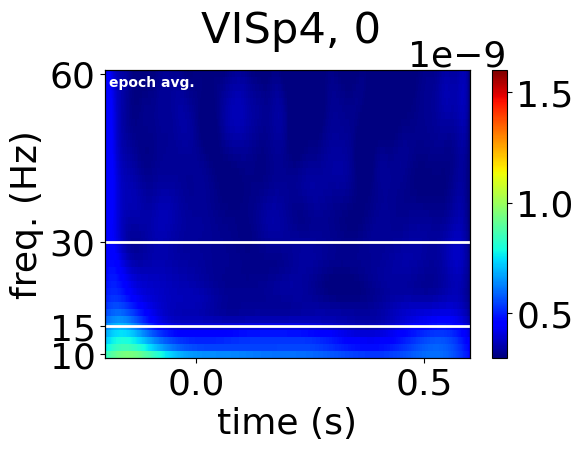

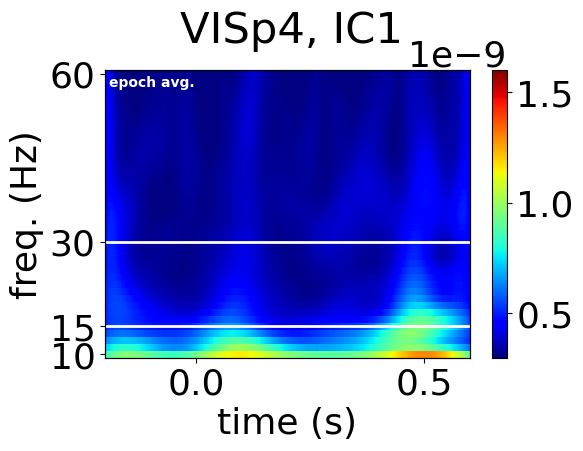

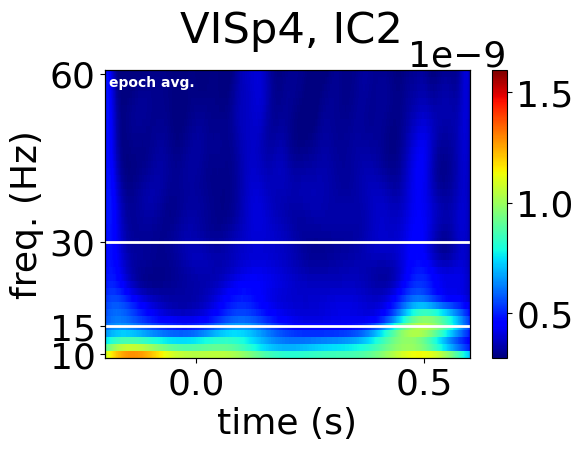

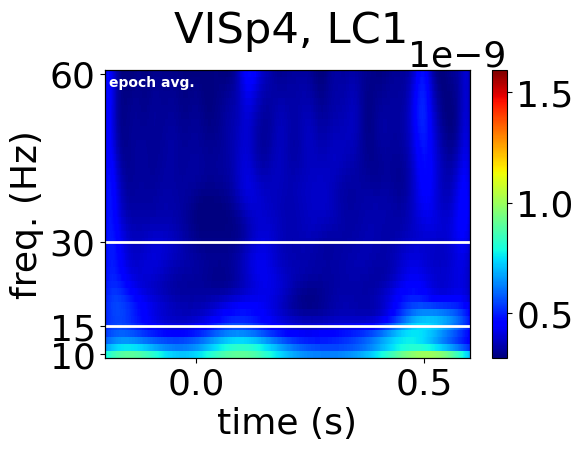

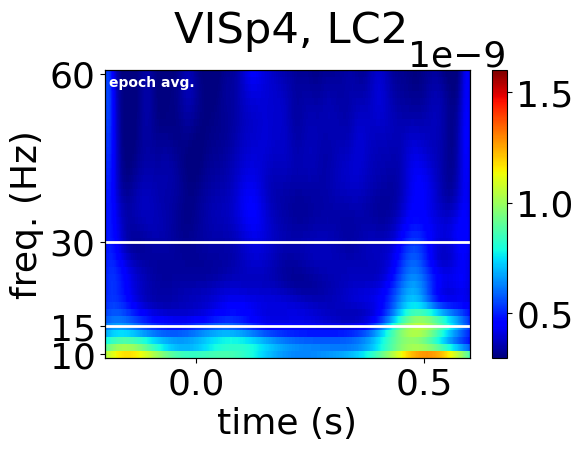

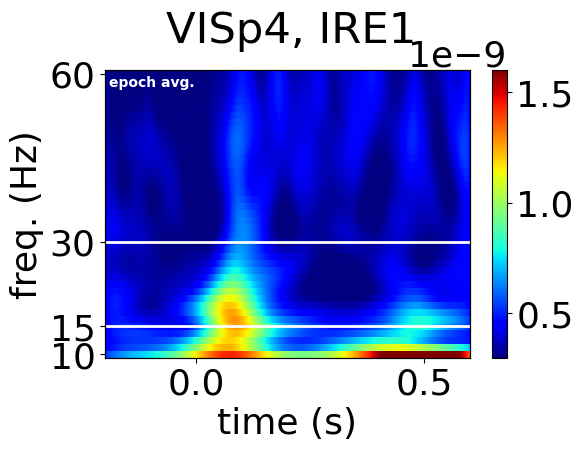

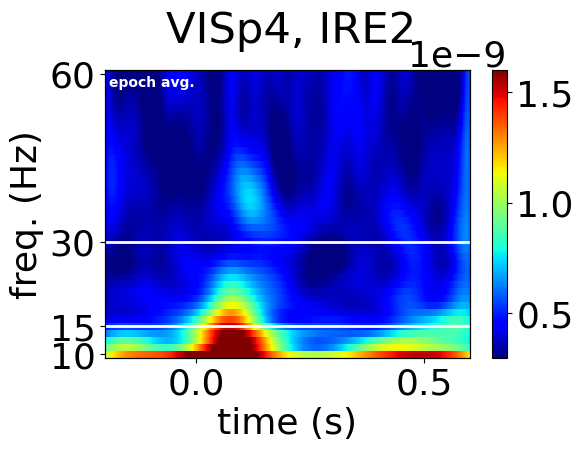

In [33]:
for frame_num, stimtype in frame_stimtype :        
    target_windows = filtered_windows[frame_num]
    # dataset parameters
    n_trials = target_windows.shape[0]           # number of trials per subject
    n_times = target_windows.shape[1]            # number of time samples per trial
    samp_freq = interp_hz  
    channel = 61
    # set parameters
    sefreqs = list(np.arange(10, 60 + 1, 1.25))   # fequency values (Hz) over which to calculate TFR
    times = np.arange(n_times) / samp_freq -0.2# seconds
    event_band = [15, 30]  # beta band (Hz)

    #vlim = [2.5e-10, 6.5e-10]
    vlim = [0.3e-9, 1.6e-9]
    sesig = target_windows[:,:,channel]
    #print(windows.shape)
    # calculate TFR
    tfrs = se.tfr(sesig, sefreqs, interp_hz)
    #print(tfrs.shape)
    fig = plot_avg_spectrogram_p(tfr=tfrs, times=times, freqs=sefreqs, event_band=event_band, vlim=vlim)
    fig.suptitle(lfp.electrodes['location'][channel] + ", " + stimtype)
#     example_trials = [0, 15, 30]
#     #vlim = [0, 2e-9]
#     thresh_FOM = 6  # factor-of-the-median threshold
#     # find spectral events!!
#     spec_events = se.find_events(tfr=tfrs, times=times, freqs=sefreqs,
#                                  event_band=event_band, threshold_FOM=thresh_FOM)

#     #print(len(spec_events))  # number of trials
#     #print(len(spec_events[0]))  # number of events in the 1st trial
#     spec_events[0][0]  # features of the 1st event of the 1st trial

#     fig = se.plot_avg_spectrogram(tfr=tfrs,
#                                   times=times,
#                                   freqs=sefreqs,
#                                   event_band=event_band,
#                                   spec_events=spec_events,  # note the spec_events argument!
#                                   timeseries=sesig,
#                                   example_epochs=example_trials,
#                                   show_events=True,  # note the show_events argument!
#                                   vlim=vlim)
#     fig.suptitle(lfp.electrodes['location'][channel] + ", " + stimtype)


In [27]:
stimulus_names = stim_nwb.intervals.keys()
# extract epoch times from stim table where stimulus rows have a different 'block' than following row
# returns list of epochs, where an epoch is of the form (stimulus name, stimulus block, start time, stop time)
def extract_epochs(stim_name, stim_table, epochs):
    
    # specify a current epoch stop and start time
    epoch_start = stim_table.start_time[0]
    epoch_stop = stim_table.stop_time[0]

    # for each row, try to extend current epoch stop_time
    for i in range(len(stim_table)):
        this_block = stim_table.stimulus_block[i]
        # if end of table, end the current epoch
        if i+1 >= len(stim_table):
            epochs.append((stim_name, this_block, epoch_start, epoch_stop))
            break
            
        next_block = stim_table.stimulus_block[i+1]
        # if next row is the same stim block, push back epoch_stop time
        if next_block == this_block:
            epoch_stop = stim_table.stop_time[i+1]
        # otherwise, end the current epoch, start new epoch
        else:
            epochs.append((stim_name, this_block, epoch_start, epoch_stop))
            epoch_start = stim_table.start_time[i+1]
            epoch_stop = stim_table.stop_time[i+1]
    
    return epochs
# extract epochs from all valid stimulus tables
epochs = []
for stim_name in stimulus_names:
    stim_table = stim_nwb.intervals[stim_name]
    try:
        epochs = extract_epochs(stim_name, stim_table, epochs)
    except:
        continue

# epochs take the form (stimulus name, stimulus block, start time, stop time)
print(len(epochs))
epochs.sort(key=lambda x: x[2])
for epoch in epochs:
    print(epoch)

6
('ICwcfg1_presentations', 0.0, 62.28759, 4353.8951)
('ICwcfg0_presentations', 1.0, 4666.15762, 5218.6221)
('ICkcfg1_presentations', 2.0, 5226.62883, 5779.09334)
('ICkcfg0_presentations', 3.0, 5787.10007, 6339.56459)
('RFCI_presentations', 4.0, 6347.62139, 6527.82286)
('sizeCI_presentations', 5.0, 6557.88152, 7278.13709)


In [25]:
def get_spontaneous_timestamps_data(lfp) :
    period_start = 4360
    period_end = 4660
    
    period_start_idx, period_end_idx = None, None
    for i, ts in enumerate(lfp.timestamps):
        if not period_start_idx and ts >= period_start:
            period_start_idx = i
        if period_start_idx and ts >= period_end:
            period_end_idx = i
            break
            
    if period_start_idx == None or period_end_idx == None:
        raise ValueError("Period bounds not found within lfp data")
    #print(period_start_idx, lfp.timestamps[period_start_idx])
    # get slice of LFP data corresponding to the period bounds
    lfp_timestamps = lfp.timestamps[period_start_idx:period_end_idx]
    lfp_data = lfp.data[period_start_idx:period_end_idx]
    return lfp_timestamps, lfp_data

spontaneous_lfp_timestamps, spontaneous_lfp_data = get_spontaneous_timestamps_data(lfp)

spontaneous_interp_lfp = get_interp_lfp(interp_hz, spontaneous_lfp_timestamps, spontaneous_lfp_data)
filtered_spontaneous = scipy.signal.filtfilt(butter_b, butter_a, spontaneous_interp_lfp, axis = 0)

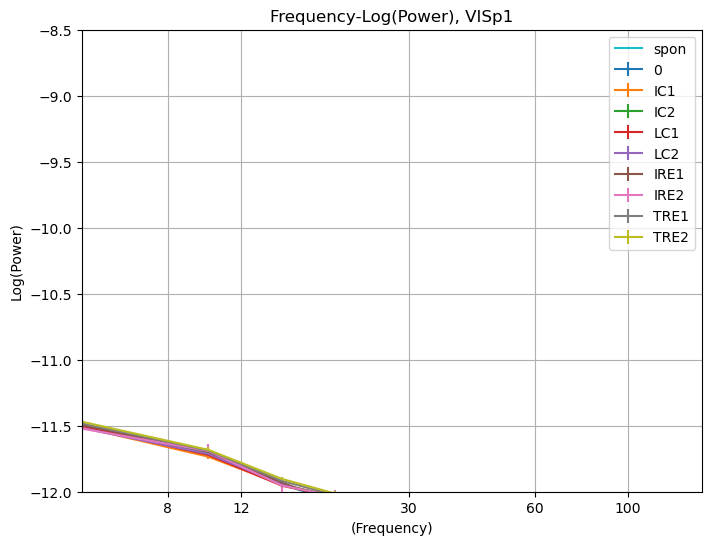

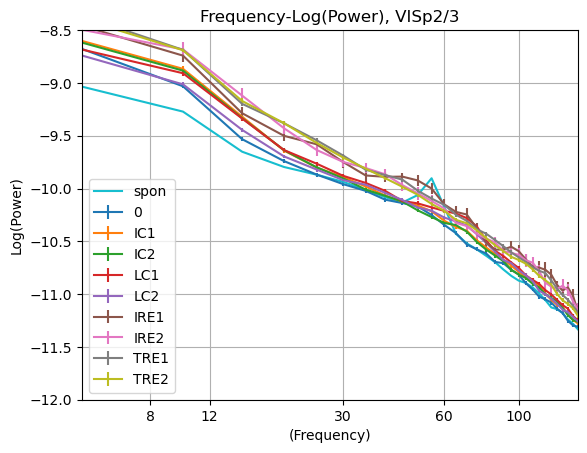

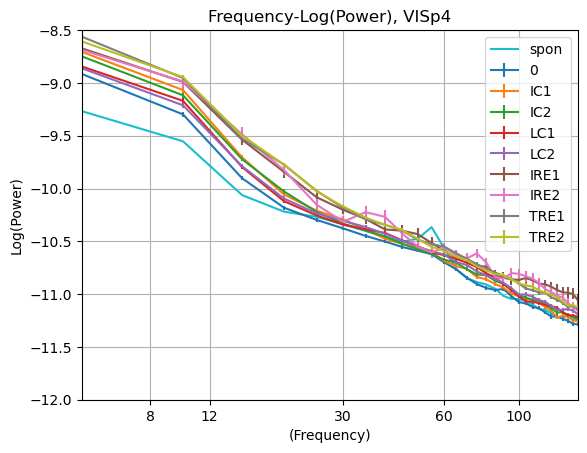

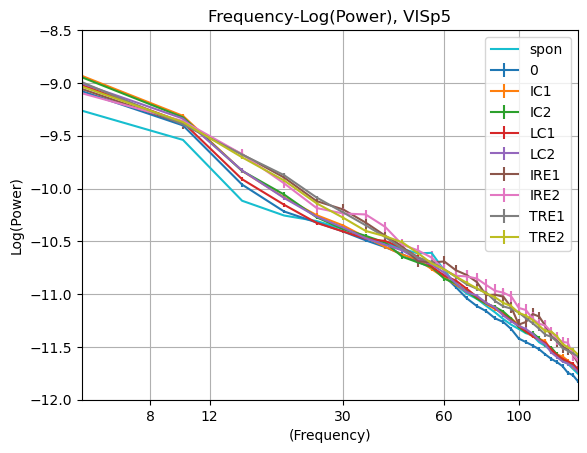

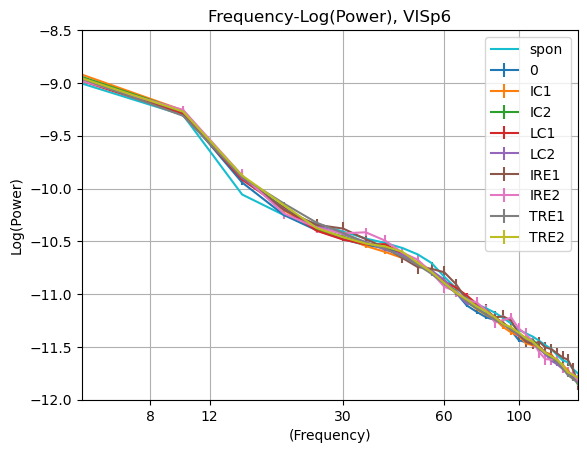

In [33]:
#frame_num : type 
#3, IC1, 4, LC1, 6, LC2, 7, IC2, 8, IRE1, 9, IRE2
# Import spectral power functions
from neurodsp.spectral import compute_spectrum, rotate_powerlaw

# Import utilities for loading and plotting data
from neurodsp.utils import create_times
from neurodsp.utils.download import load_ndsp_data
from neurodsp.plts.spectral import plot_power_spectra
from neurodsp.plts.time_series import plot_time_series

from scipy.stats import sem

frame_stimtype = [(0, '0'), (3, 'IC1'), (7, 'IC2'), (4, 'LC1'), (6, 'LC2'), (8, 'IRE1'), (9, 'IRE2'), (10, 'TRE1'), (11, 'TRE2')]

rep_window_loc = [(73, "VISp1"), (67, "VISp2/3"), (61, "VISp4"), (56, "VISp5"), (49, "VISp6")]
fs = 1000
target_windows = filtered_stim_windows




# Plot the loaded signal
#plot_time_series(times, sig, xlim=[0, 1.2])

# plt.figure(figsize=(8, 6))

# for channel, layer in rep_window_loc :
#     psds_list = []
#     for trial in range(target_windows.shape[0]) :
#         dspsig = target_windows[trial, :, channel]
#         freq_mean, psd_mean = compute_spectrum(dspsig, fs, method='welch', avg_type='mean', nperseg=fs*0.4)
#         psds_list.append(psd_mean)
#     psds = np.array(psds_list)
#     psd_average = np.average(psds, axis = 0)
#     #print(psd_average.shape)
#     plt.plot(np.log10(freq_mean[1:]), np.log10(psd_average[1:]), label = layer)
# plt.xlim(np.log10(freq_mean[1]), 2)
#     #plt.xscale('log')
# plt.xticks([np.log10(8), np.log10(12), np.log10(30), np.log10(60)], [8, 12, 30, 60])
# plt.xlabel('(Frequency)')
# plt.ylabel('Log(Power)')
# plt.title('Frequency-Log(Power)')
# plt.grid(True)
# plt.legend()
# plt.ylim([-13, -7.5])
# plt.show()
#     #plot_power_spectra(freq_mean, psd_average, 'Welch')

plt.figure(figsize=(8, 6))

for channel, layer in rep_window_loc :
    for frame_num, stimtype in frame_stimtype :
        times = create_times(target_windows[frame_num].shape[1]/fs, fs)
        psds_list = []
        for trial in range(target_windows[frame_num].shape[0]) :
            dspsig = target_windows[frame_num][trial, :, channel]
            freq_mean, psd_mean = compute_spectrum(dspsig, fs, method='welch', avg_type='mean', nperseg=fs*0.2)
            psds_list.append(psd_mean)
        psds = np.array(psds_list)
        psd_average = np.average(psds, axis = 0)
        #print(psd_average.shape)
        plt.errorbar(np.log10(freq_mean[1:]), np.log10(psd_average[1:]), yerr = sem(np.log10(psds))[1:], label = stimtype)
    ###################### for spontaneous data
    target = filtered_spontaneous
    times = create_times(target.shape[0]/fs, fs)
    dspsig = target[:, channel]
    freq_mean, psd_mean = compute_spectrum(dspsig, fs, method='welch', avg_type='mean', nperseg=fs*0.2)
    
    plt.plot(np.log10(freq_mean[1:]), np.log10(psd_mean[1:]), label = 'spon')
    ######################
    plt.xlim(np.log10(freq_mean[1]), np.log10(150))
    plt.xticks([np.log10(8), np.log10(12), np.log10(30), np.log10(60), np.log10(100)], [8, 12, 30, 60, 100])
    plt.xlabel('(Frequency)')
    plt.ylabel('Log(Power)')
    plt.title('Frequency-Log(Power), ' + layer)
    plt.grid(True)
    plt.legend()
    plt.ylim([-12, -8.5])
    plt.show()
    
    
# for trial in range(target_windows[frame_num].shape[0]) :
#     dspsig = target_windows[frame_num][trial, :, target_channel]
#     freq_mean, psd_mean = compute_spectrum(dspsig, fs, method='welch', avg_type='mean', nperseg=fs*0.4)
#     psds_list.append(psd_mean)
# psds = np.array(psds_list)
# psd_average = np.average(psds, axis = 0)
# # Initialize FOOOF object
# fm = FOOOF()

# # Define frequency range across which to model the spectrum
# freq_range = [0, 200]

# # Model the power spectrum with FOOOF, and print out a report
# #for i in range(psd.shape[1]):
# #    fm.report(freqs, psd[:, i], freq_range)
# # fig = fm.report(freq_mean, psd_average, freq_range, plt_log=True)

# fm.fit(freq_mean, psd_average, freq_range)
# fig = fm.plot(plt_log = True)

# #plot_annotated_model(fm, plt_log=True)

In [ ]:
target_channel = 61
psds_list = []
dspsig = target[:, target_channel]
freq_mean, psd_mean = compute_spectrum(dspsig, fs, method='welch', avg_type='mean', nperseg=fs*0.4)
psds_list.append(psd_mean)
psds = np.array(psds_list)
psd_average = np.average(psds, axis = 0)
# Initialize FOOOF object
fm = FOOOF()

# Define frequency range across which to model the spectrum
freq_range = [0, 200]

fig = fm.report(freq_mean, psd_average, freq_range, plt_log=True)

fm.fit(freq_mean, psd_average, freq_range)
fig = fm.plot(plt_log = True)

plot_annotated_model(fm, plt_log=True)

In [38]:
%matplotlib inline

import sys
import os.path as op
from glob import glob
# import seaborn as sns
# sns.set()

# set path to SpectralEvents if necessary
# sys.path.append('/PATH/TO/FOLDER/SpectralEvents')
import spectralevents as se

(1, 60, 300000)


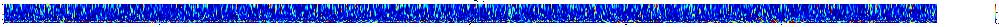

In [39]:
rep_window_loc_dic = {"VISp1" : 73,"VISp2/3" : 67, "VISp4" : 61, "VISp5" : 56, "VISp6" : 49}
target_windows = filtered_spontaneous
# dataset parameters
n_times = target_windows.shape[0]            # number of time samples per trial
samp_freq = interp_hz
layer = 'VISp4'
channel = rep_window_loc_dic[layer]
# set parameters
freq_band = {'alpha':[8, 12], 'beta':[12, 30], 'low gamma': [30, 60], 'high gamma' : [60, 100]}

sefreqs = list(np.arange(1, 60 + 1))   # fequency values (Hz) over which to calculate TFR ################# how about welch?
times = np.arange(n_times) / samp_freq# seconds
freq_type = 'beta'
event_band = freq_band[freq_type]  # gamma band (Hz)

vlim = [0, 2.5e-9]
sesig = target_windows[:,channel]
#print(windows.shape)
# calculate TFR
tfrs = se.tfr(sesig, sefreqs, interp_hz)
print(tfrs.shape)
fig = se.plot_avg_spectrogram(tfr=tfrs, times=times, freqs=sefreqs, event_band=event_band, vlim=vlim)
fig.suptitle(lfp.electrodes['location'][channel] + ", spon")
fig.set_size_inches(400, 8)


In [40]:
example_trials = [0]
vlim = [0, 4e-9]
thresh_FOM = 6  # factor-of-the-median threshold

# find spectral events!!
spec_events = se.find_events(tfr=tfrs, times=times, freqs=sefreqs,
                             event_band=event_band, threshold_FOM=thresh_FOM)[0]
# print(len(spec_events))  # number of trials
# print(len(spec_events[0]))  # number of events in the 1st trial
# print(spec_events[0][0])  # features of the 1st event of the 1st trial
# cnt = 0
# for i in range(300) :
#     cnt += len(spec_events[i])
#     #print(len(spec_events[i]))
# print(cnt)
#fig = se.plot_avg_spectrogram(tfr=tfrs, times=times, freqs=sefreqs, event_band=event_band, spec_events=spec_events, show_events=True, vlim=vlim)
#fig.set_size_inches(400, 8)
# fig = se.plot_avg_spectrogram(tfr=tfrs,
#                               times=times,
#                               freqs=sefreqs,
#                               event_band=event_band,
#                               spec_events=spec_events,  # note the spec_events argument!
#                               timeseries=temp,
#                               example_epochs=example_trials,
#                               show_events=True,  # note the show_events argument!
#                              )#vlim=vlim)
# fig.suptitle(lfp.electrodes['location'][channel] + ", spon")
# fig.set_size_inches(400, 8)
spec_events.sort(key = lambda x : x['Peak Power'], reverse = True)


In [41]:
filtered_spontaneous.shape

(300000, 84)

In [42]:
##############

In [43]:
rep_window_loc_dic = {"VISp1" : 73,"VISp2/3" : 67, "VISp4" : 61, "VISp5" : 56, "VISp6" : 49}
freq_band = {'alpha':[8, 12], 'beta':[15, 30], 'low gamma': [30, 60], 'high gamma' : [60, 100]}
freq_type = 'beta'
target_windows = filtered_spontaneous
# dataset parameters
n_times = target_windows.shape[0]            # number of time samples per trial
samp_freq = interp_hz
sefreqs = list(np.arange(1, 60 + 1))   # fequency values (Hz) over which to calculate TFR ################# how about welch?
times = np.arange(n_times) / samp_freq# seconds
vlim = [0, 2.5e-9]
thresh_FOM = 6  # factor-of-the-median threshold
spec_events_dic = {}
for layer in rep_window_loc_dic.keys() :
    
    channel = rep_window_loc_dic[layer]
    event_band = freq_band[freq_type]  # gamma band (Hz)
    sesig = target_windows[:,channel]

    tfrs = se.tfr(sesig, sefreqs, interp_hz)

    #se.plot_avg_spectrogram(tfr=tfrs, times=times, freqs=sefreqs, event_band=event_band)

    # find spectral events!!
    spec_events = se.find_events(tfr=tfrs, times=times, freqs=sefreqs,
                                 event_band=event_band, threshold_FOM=thresh_FOM)[0]

    spec_events.sort(key = lambda x : x['Peak Time'])
    spec_events_dic[layer] = spec_events


In [44]:
#####################

In [45]:
freq_events = []
layer = "VISp4"
spec_events = spec_events_dic[layer]
for spec_event in spec_events[:50] :
    freq_events.append(spec_event['Peak Time'])
freq_events = np.array(freq_events)
spontaneous_lfp_timestamps_g = spontaneous_lfp_timestamps - spontaneous_lfp_timestamps[0]
spon_window_start_time = -0.06
spon_window_end_time = 0.06
spontaneous_freq_windows = get_windows(spon_window_start_time, spon_window_end_time, interp_hz, freq_events, spontaneous_lfp_timestamps_g, filtered_spontaneous)
spontaneous_average_trace = np.average(spontaneous_freq_windows, axis=0)


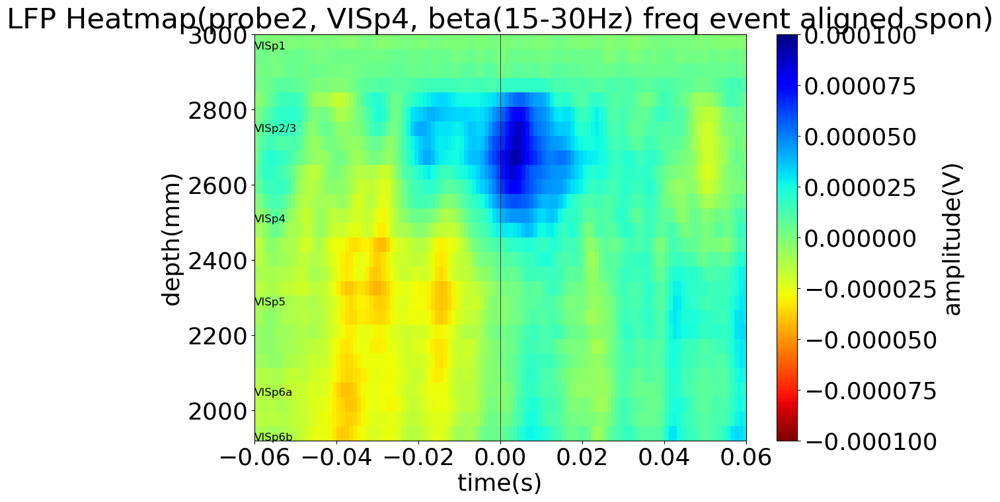

In [46]:
###freq event aligned spontaneous LFP
plt.figure(figsize=(12,8))
norm = mpl.colors.Normalize(vmin=-0.0001, vmax=0.0001)
xaxis = np.linspace(spon_window_start_time, spon_window_end_time, spontaneous_average_trace.shape[0])
depth = np.array(lfp.electrodes["probe_vertical_position"][start_channel:end_channel])
im = plt.imshow(spontaneous_average_trace[:,start_channel:end_channel].T,aspect='auto',origin='lower', extent=[xaxis.min(), xaxis.max(), depth.min(), depth.max()], norm=norm)
cb = plt.colorbar(im, label="amplitude(V)")
plt.set_cmap('jet_r')
plt.xlabel('time(s)')
plt.ylabel('depth(mm)')
plt.title('LFP Heatmap(probe'+ str(probe_num) +', ' + layer +', ' + freq_type + "(" + str(freq_band[freq_type][0]) + "-" + str(freq_band[freq_type][1]) + 'Hz) freq event aligned spon)')

for loc, ypos in loc_pos :
    plt.text(xaxis.min(), ypos, loc, fontsize=12)
plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
#plt.axvline(0.4, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
plt.show()

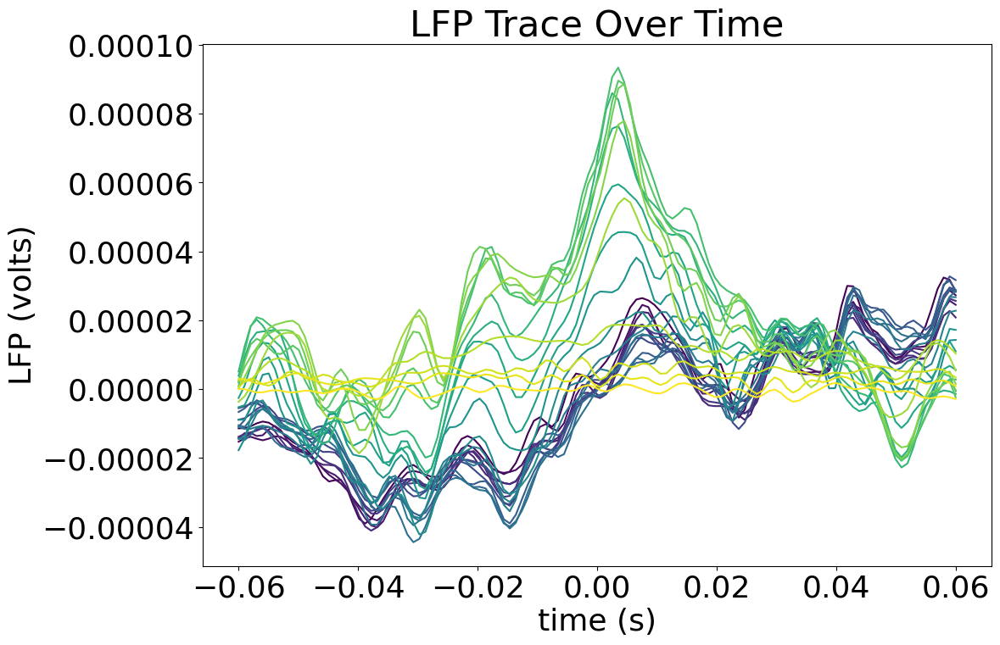

In [47]:
xaxis = np.linspace(spon_window_start_time, spon_window_end_time, spontaneous_average_trace.shape[0])
fig, ax = plt.subplots(figsize=(12,8))
colors = plt.cm.viridis(np.linspace(0, 1, n_channels))

ax.set_prop_cycle(color=colors)
ax.plot(xaxis, spontaneous_average_trace[:,start_channel:end_channel])
#cb = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=plt.cm.viridis), location="left", pad = 0.01, anchor=(0,1), shrink=0.3, ax=ax, label='Depth (channel #)')

plt.xlabel("time (s)")
plt.ylabel("LFP (volts)")
plt.title("LFP Trace Over Time")
plt.show()

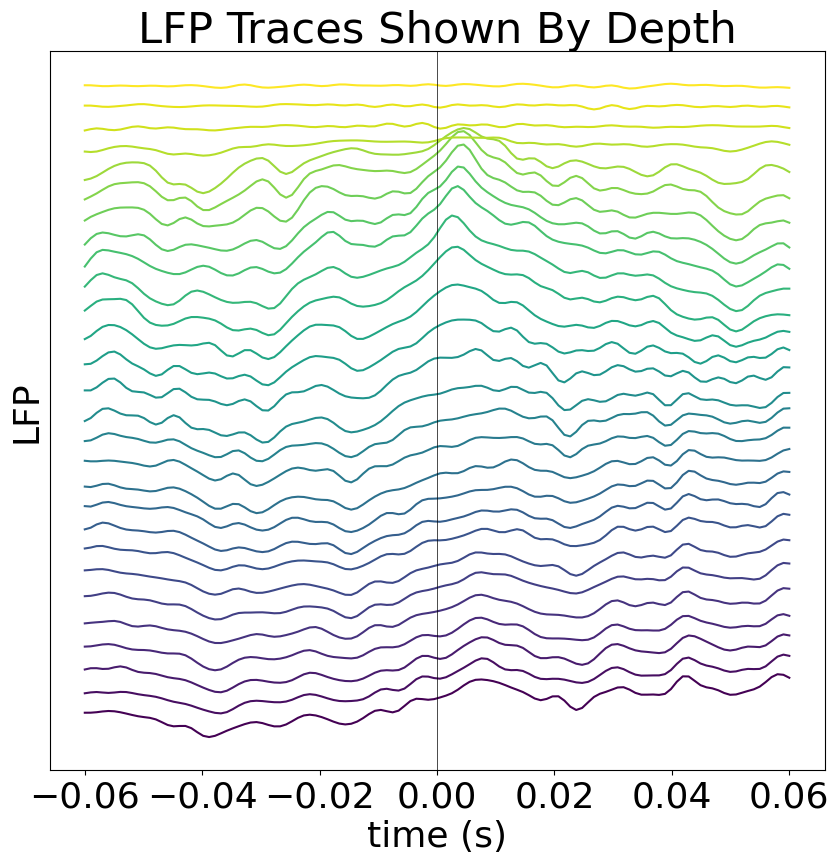

In [48]:
# Change this if the visualization below looks messy. The larger value the flatter
amp_res = 0.000026

xaxis = np.linspace(spon_window_start_time, spon_window_end_time, spontaneous_average_trace.shape[0])
colors = plt.cm.viridis(np.linspace(0, 1, n_channels))
fig, ax = plt.subplots(figsize=(10, n_channels/3))

for i, channel in enumerate(range(start_channel, end_channel)):
    offset_trace = spontaneous_average_trace[:,channel] + i*amp_res
    plot = ax.plot(xaxis, offset_trace, color=colors[i])

norm = mpl.colors.Normalize(vmin=start_channel, vmax=end_channel)
#cb = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=plt.cm.viridis), location="left", pad = 0.01, anchor=(0,1), shrink=0.3, ax=ax, label='Depth (channel #)')
ax.yaxis.set_ticks([])
plt.xlabel("time (s)")
plt.ylabel("LFP")
plt.title("LFP Traces Shown By Depth")
plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
plt.show()

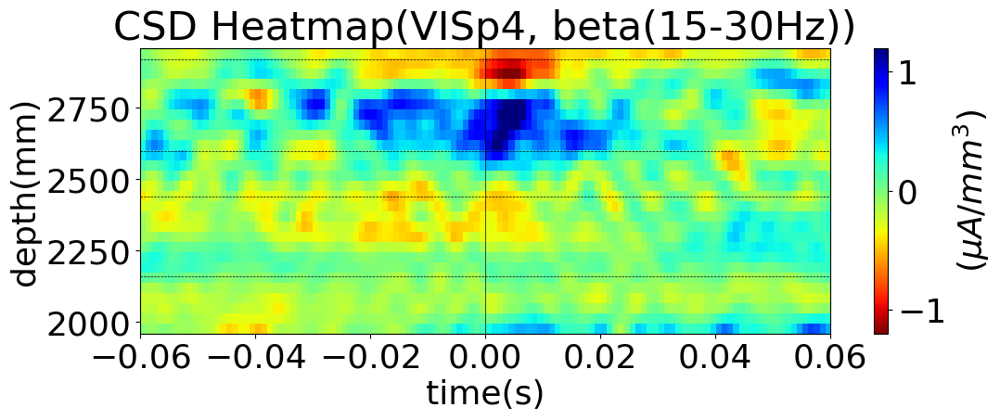

In [49]:
spontaneous_filt_csd = compute_csd(spontaneous_average_trace[:,start_channel:end_channel].T, coord_electrodes = np.linspace(0,1000E-6,n_channels) * pq.m)
plt.figure(figsize=(12,4))
norm = mpl.colors.Normalize(vmin = -1.2, vmax = 1.2)
xaxis = np.linspace(spon_window_start_time, spon_window_end_time, len(spontaneous_filt_csd))
depth =  np.array(lfp.electrodes["probe_vertical_position"][start_channel+1:end_channel-1])
im = plt.imshow(spontaneous_filt_csd, aspect = 'auto', origin = 'lower', extent=[xaxis.min(), xaxis.max(), depth.min(), depth.max()], norm=norm)
cb = plt.colorbar(im, label=r"($\mu A/mm^3$)")
plt.set_cmap('jet_r')
plt.xlabel('time(s)')
plt.ylabel('depth(mm)')
plt.title('CSD Heatmap(' + layer +', '  + freq_type + "(" + str(freq_band[freq_type][0]) + "-" + str(freq_band[freq_type][1]) + 'Hz))')
for ypos in boundary :
    if ypos >= depth.max() or ypos <= depth.min() : continue
    plt.axhline(ypos, 0, 1, color = 'black', linestyle = '--', linewidth = 0.5)
# for loc, ypos in loc_pos :
#     #if ypos > depth.min() and ypos < depth.max() : plt.text(0, ypos, loc, fontsize=21)
#     plt.text(xaxis.min(), ypos, loc, fontsize=12)

plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
plt.show()

In [50]:
def short_spon(lfp, period_start, period_end) :
    
    period_start_idx, period_end_idx = None, None
    for i, ts in enumerate(lfp.timestamps):
        if not period_start_idx and ts >= period_start:
            period_start_idx = i
        if period_start_idx and ts >= period_end:
            period_end_idx = i
            break
            
    if period_start_idx == None or period_end_idx == None:
        raise ValueError("Period bounds not found within lfp data")
    #print(period_start_idx, lfp.timestamps[period_start_idx])
    # get slice of LFP data corresponding to the period bounds
    lfp_timestamps = lfp.timestamps[period_start_idx:period_end_idx]
    lfp_data = lfp.data[period_start_idx:period_end_idx]
    return lfp_timestamps, lfp_data

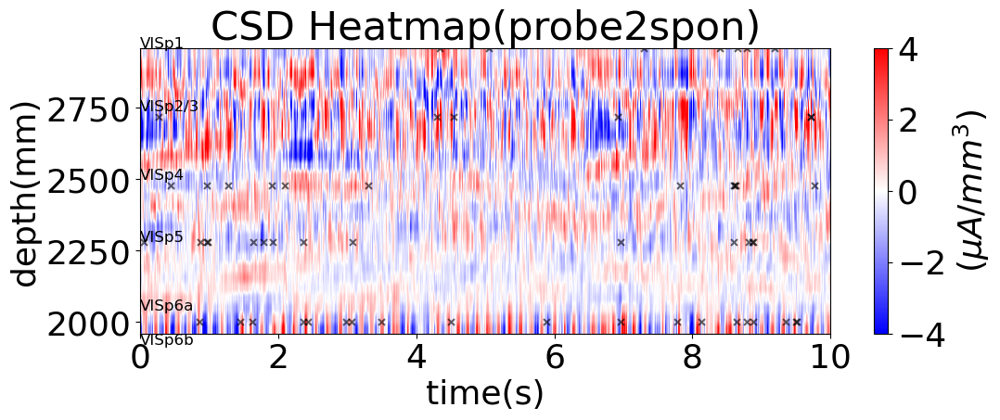

In [51]:
short_spon_timestamps, short_spon_lfp_data = short_spon(lfp, 4360, 4370)
short_spon_interp_lfp = get_interp_lfp(interp_hz, short_spon_timestamps, short_spon_lfp_data)
filtered_short_spon = scipy.signal.filtfilt(butter_b, butter_a, short_spon_interp_lfp, axis = 0)

spontaneous_csd = compute_csd(filtered_short_spon[:,start_channel:end_channel].T, coord_electrodes = np.linspace(0,1000E-6,n_channels) * pq.m)
plt.figure(figsize=(12,4))
norm = mpl.colors.Normalize(vmin = -4., vmax = 4.)
xaxis = np.linspace(0, 10, len(filtered_short_spon))
depth =  np.array(lfp.electrodes["probe_vertical_position"][start_channel+1:end_channel-1])
im = plt.imshow(spontaneous_csd, aspect = 'auto', origin = 'lower', extent=[xaxis.min(), xaxis.max(), depth.min(), depth.max()], norm=norm)
cb = plt.colorbar(im, label=r"($\mu A/mm^3$)")
plt.set_cmap('bwr')
plt.xlabel('time(s)')
plt.ylabel('depth(mm)')
plt.title('CSD Heatmap(probe'+ str(probe_num) + 'spon)')
for loc, ypos in loc_pos :
    #if ypos > depth.min() and ypos < depth.max() : plt.text(0, ypos, loc, fontsize=21)
    plt.text(xaxis.min(), ypos, loc, fontsize=12)



for layer in rep_window_loc_dic.keys() :
    rep_window_loc_dic = {"VISp1" : 73,"VISp2/3" : 67, "VISp4" : 61, "VISp5" : 56, "VISp6" : 49}
    event_times = []
    spec_events = spec_events_dic[layer]
    for event in spec_events :
        if event['Peak Time'] < 10 : event_times.append(event['Peak Time'])
    #event_times = [event['Peak Time'] for event in spec_events]
    alpha = lambda x : (0.6 + 0.4 * np.exp(-0.2 * (x - 30))  # noqa
                            / (1 + np.exp(-0.2 * (x - 30))))  # noqa
    plt.scatter(event_times[:52], [lfp.electrodes['probe_vertical_position'][[rep_window_loc_dic[layer]]] for _ in range(len(event_times[:52]))], s=25, c='black', marker='x',
                   alpha=alpha(len(spec_events)))
plt.plot()
    
plt.axvline(0, 0, 1, color = 'black', linestyle = 'solid', linewidth = 0.5)
plt.show()

In [58]:
for i in range(12) :
    short_spon_timestamps, short_spon_lfp_data = short_spon(lfp, 4360 + 25 * i, 4360 + 25 * (i+1))
    short_spon_interp_lfp = get_interp_lfp(interp_hz, short_spon_timestamps, short_spon_lfp_data)
    filtered_short_spon = scipy.signal.filtfilt(butter_b, butter_a, short_spon_interp_lfp, axis = 0)
    
    #rep_window_loc_dic = {"VISam1" : 73,"VISam2/3" : 67, "VISam4" : 62, "VISam5" : 58, "VISam6a" : 52}#0-619296
    #rep_window_loc_dic = {"VISpm1" : 74,"VISpm2/3" : 69, "VISpm4" : 64, "VISpm5" : 58, "VISpm6a" : 52}#1-619296
    rep_window_loc_dic = {"VISp1" : 73,"VISp2/3" : 67, "VISp4" : 61, "VISp5" : 56, "VISp6" : 49}#2-619296
    #rep_window_loc_dic = {"VISl1" : 77}#3-619296
    #rep_window_loc_dic = {"VISal1" : 76,"VISal2/3" : 72, "VISal4" : 68, "VISal5" : 64, "VISal6a" : 59}#4-619296
    #rep_window_loc_dic = {"VISam1" : 77,"VISam2/3" : 71, "VISam4" : 68, "VISam5" : 65, "VISam6a" : 61}#0-620334
    #rep_window_loc_dic = {"VISpm1" : 71,"VISpm2/3" : 67, "VISpm4" : 65, "VISpm5" : 62, "VISpm6a" : 59}#1-620334
    #rep_window_loc_dic = {"VISp1" : 70,"VISp2/3" : 65, "VISp4" : 62, "VISp5" : 59, "VISp6a" : 55}#2-620334
    #rep_window_loc_dic = {"VISl1" : 76,"VISl2/3" : 73, "VISl4" : 69, "VISl5" : 64, "VISl6a" : 59}#3-620334
    #rep_window_loc_dic = {"VISl1" : 71,"VISl2/3" : 67, "VISl4" : 64, "VISl5" : 61, "VISl6a" : 57}#4-620334
    #rep_window_loc_dic = {"VISrl1" : 80,"VISrl2/3" : 75, "VISrl4" : 70, "VISrl5" : 66, "VISrl6a" : 62}#5-620334
    freq_band = {'alpha':[8, 12], 'beta':[12, 30], 'low gamma': [30, 60], 'high gamma' : [60, 100]}
    freq_type = 'beta'
    target_windows = filtered_short_spon
    # dataset parameters
    n_times = target_windows.shape[0]            # number of time samples per trial
    samp_freq = interp_hz
    sefreqs = list(np.arange(1, 100 + 1))   # fequency values (Hz) over which to calculate TFR ################# how about welch?
    times = np.arange(n_times) / samp_freq# seconds
    vlim = [0, 2.5e-9]
    thresh_FOM = 6  # factor-of-the-median threshold
    spec_events_dic = {}
    for layer in rep_window_loc_dic.keys() :

        channel = rep_window_loc_dic[layer]
        event_band = freq_band[freq_type]  # gamma band (Hz)
        sesig = target_windows[:,channel]

        tfrs = se.tfr(sesig, sefreqs, interp_hz)

        #se.plot_avg_spectrogram(tfr=tfrs, times=times, freqs=sefreqs, event_band=event_band)

        # find spectral events!!
        spec_events = se.find_events(tfr=tfrs, times=times, freqs=sefreqs,
                                     event_band=event_band, threshold_FOM=thresh_FOM)[0]

        spec_events.sort(key = lambda x : x['Peak Time'])
        spec_events_dic[layer] = spec_events

    spontaneous_csd = compute_csd(filtered_short_spon[:,start_channel:end_channel].T, coord_electrodes = np.linspace(0,1000E-6,n_channels) * pq.m)
    plt.figure(figsize=(32,4))
    spontaneous_csd = moving_avarage_smoothing(spontaneous_csd, 25)
    norm = mpl.colors.Normalize(vmin = -5., vmax = 5.)
    xaxis = np.linspace(0, 25, len(filtered_short_spon))
    depth =  np.array(lfp.electrodes["probe_vertical_position"][start_channel+1:end_channel-1])
    im = plt.imshow(spontaneous_csd, aspect = 'auto', origin = 'lower', extent=[xaxis.min(), xaxis.max(), depth.min(), depth.max()], norm=norm)
    cb = plt.colorbar(im, label=r"($\mu A/mm^3$)")
    plt.set_cmap('bwr')
    plt.xlabel('time(s)')
    plt.ylabel('depth(mm)')
    plt.title('CSD Heatmap(probe'+ str(probe_num) + 'spon)')
    for loc, ypos in loc_pos :
        #if ypos > depth.min() and ypos < depth.max() : plt.text(0, ypos, loc, fontsize=21)
        plt.text(xaxis.min(), ypos, loc, fontsize=12)


    for layer in rep_window_loc_dic.keys() :
        event_times = []
        spec_events = spec_events_dic[layer]
        for event in spec_events :
            event_times.append(event['Peak Time'])
        #event_times = [event['Peak Time'] for event in spec_events]
        alpha = lambda x : (0.6 + 0.4 * np.exp(-0.2 * (x - 30))  # noqa
                                / (1 + np.exp(-0.2 * (x - 30))))  # noqa
        plt.scatter(event_times[:], [lfp.electrodes['probe_vertical_position'][[rep_window_loc_dic[layer]]] for _ in range(len(event_times[:]))], s=25, c='black', marker='x',
                       alpha=alpha(len(spec_events)))
    print(i)
    plt.savefig(f'../material/event/CSD_Heatmap(probe{probe_num}spon){i}.jpg', format='jpeg')
    plt.close()

0
1
2
3
4
5
6
7
8
9
10
11


In [ ]:
a = moving_avarage_smoothing(spontaneous_csd, 5)

In [57]:
def moving_avarage_smoothing(X,k):
    S = np.zeros(X.shape)
    for i in range(X.shape[0]) :
        for t in range(X.shape[1]) :
            if t < k:
                S[i][t] = np.mean(X[i][:t+k])
            else:
                S[i][t] = np.sum(X[i][t-k:t+k])//(2 * k + 1)
    return S

In [ ]:
from sklearn.ensemble import RandomForestClassifier



In [181]:
filtered_spontaneous.shape

NameError: name 'filtered_spontaneous' is not defined